# **Predictive Maintenance for Industrial Machinery: Leveraging Machine Learning to Minimize Downtime**
---
                                                                 Name : VISHNU E
                                                                 Organization : Entri Software Pvt Limited
                                                                 Date : 13/05/2024


## **Problem Statement**

---



This project has been done in fulfillment to the Capstone Project requirement of Entri Elevate's Data Science and Machine Learning Program.

In the field of industrial maintenance and operations, the timely detection of machine failures is crucial to prevent unexpected downtime, minimize production losses and optimize maintenance strategies. Machine learning techniques have emerged as valuable tools for predicting and classifying data.

This project addresses the need for proactive maintenance strategies in industrial settings by developing a machine-learning model to predict equipment failures based on historical sensor data. By analyzing patterns in sensor readings, the model aims to forecast potential failures before they occur, enabling timely maintenance interventions. The goal is to minimize downtime, optimize resource allocation, and reduce maintenance costs by transitioning from reactive to proactive maintenance practices. Through this approach, manufacturing plants can improve operational efficiency, maximize equipment uptime, and enhance overall productivity.

## **Objectives**

---


* Development of a robust predictive maintenance model leveraging machine learning techniques.
* Reduction in unplanned downtime through proactive maintenance interventions.
* Cost savings, optimized resource allocation, and enhanced productivity in industrial machinery operations.
* Evaluate the performance of different models in predicting Machine failure.
* Evaluate the impact of different feature selection methods on the performance of predictive maintenance models.   



### Import Libraries

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

### Import Data

In [ ]:
df = pd.read_csv('predictive_maintenance_data.csv')
df

,Equipment_ID,Sensor_1,Sensor_2,Sensor_3,Environmental_Temperature,Environmental_Humidity,Production_Volume,Operating_Hours,Error_Code,Equipment_Age,Power_Consumption,Voltage_Fluctuations,Current_Fluctuations,Vibration_Analysis,Temperature_Gradients,Pressure_Levels,Failure_Maintenance_Indicator
0,766,26.80,27.88,0.009,21.4,51,1182,163,1,8,1405,3,2,0.7,23,23,1
1,964,23.99,26.31,0.006,21.9,53,1103,146,1,6,1500,4,4,0.5,24,22,1
2,45,24.17,26.93,0.003,22.2,60,1413,292,1,2,1589,5,2,0.5,21,24,0
3,53,27.66,20.30,0.010,24.6,50,1435,163,1,5,1502,8,4,0.6,24,23,0
4,797,23.30,27.03,0.007,24.2,44,1358,227,1,10,1409,8,5,0.4,22,19,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,976,26.56,24.17,0.003,20.4,56,1167,245,1,1,1483,7,2,0.7,24,18,1
9996,450,28.68,21.50,0.001,23.3,47,1236,259,0,2,1471,6,1,0.5,20,21,0
9997,354,27.00,25.46,0.007,24.7,58,1225,245,0,4,1425,8,2,0.6,19,22,0
9998,402,25.91,29.98,0.007,21.1,55,1471,213,1,3,1466,8,2,0.4,23,24,0


The Dataset has 10000 rows and 17 features

## **Exploratory Data Analysis**

### Sturcture of the Dataset

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 17 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Equipment_ID                   10000 non-null  int64  
 1   Sensor_1                       10000 non-null  float64
 2   Sensor_2                       10000 non-null  float64
 3   Sensor_3                       10000 non-null  float64
 4   Environmental_Temperature      10000 non-null  float64
 5   Environmental_Humidity         10000 non-null  int64  
 6   Production_Volume              10000 non-null  int64  
 7   Operating_Hours                10000 non-null  int64  
 8   Error_Code                     10000 non-null  int64  
 9   Equipment_Age                  10000 non-null  int64  
 10  Power_Consumption              10000 non-null  int64  
 11  Voltage_Fluctuations           10000 non-null  int64  
 12  Current_Fluctuations           10000 non-null  

The dataset has numerical values only.

### Basic Statistics

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Equipment_ID,10000.0,500.264200,289.690687,1.000,248.000,495.000,755.000,1000.00
Sensor_1,10000.0,24.992639,2.873549,20.000,22.520,25.005,27.460,30.00
Sensor_2,10000.0,24.949423,2.866201,20.000,22.460,24.930,27.450,30.00
Sensor_3,10000.0,0.005506,0.002611,0.001,0.003,0.006,0.008,0.01
Environmental_Temperature,10000.0,22.513410,1.428719,20.000,21.300,22.500,23.700,25.00
Environmental_Humidity,10000.0,49.999200,6.077491,40.000,45.000,50.000,55.000,60.00
Production_Volume,10000.0,1247.552800,143.941752,1000.000,1124.000,1246.000,1370.000,1500.00
Operating_Hours,10000.0,200.133400,58.221121,100.000,150.000,200.000,250.000,300.00
Error_Code,10000.0,0.502100,0.500021,0.000,0.000,1.000,1.000,1.00
Equipment_Age,10000.0,5.505100,2.877465,1.000,3.000,5.000,8.000,10.00


There are 1000 machines in the dataset. And the Error_code feature containing binary values only.

### Checking for null values

In [ ]:
df.isnull().sum()

Equipment_ID                     0
Sensor_1                         0
Sensor_2                         0
Sensor_3                         0
Environmental_Temperature        0
Environmental_Humidity           0
Production_Volume                0
Operating_Hours                  0
Error_Code                       0
Equipment_Age                    0
Power_Consumption                0
Voltage_Fluctuations             0
Current_Fluctuations             0
Vibration_Analysis               0
Temperature_Gradients            0
Pressure_Levels                  0
Failure_Maintenance_Indicator    0
dtype: int64

No missing values. This is a clean dataset!

###  Checking for duplicate rows

In [ ]:
duplicate_rows = df.duplicated(keep = False).sum() # by default keep = 'first', exclude first duplicate value

print('Duplicate rows:')
duplicate_rows

Duplicate rows:


0

No duplicate values

### Correlation matrix of Features

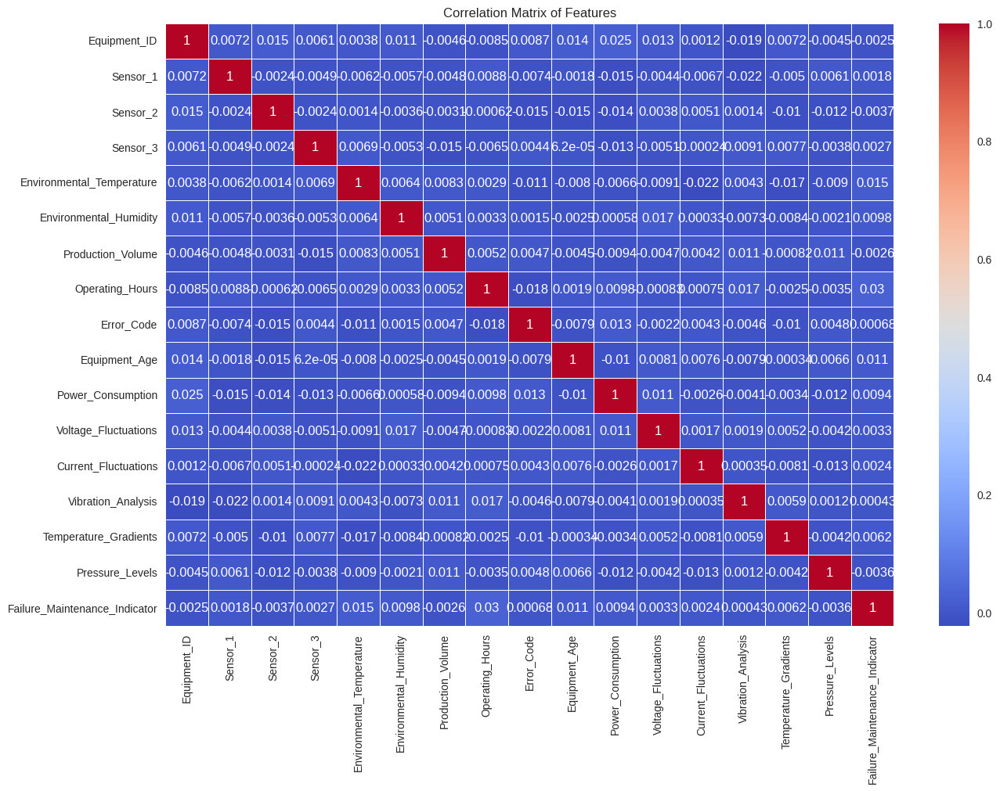

In [ ]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', linewidth = 0.5)
plt.title('Correlation Matrix of Features')
plt.show()

From the correlation matrix, it is found that the features are poorly correlated with the target variable (Failure_Maintenance_Indicator). And the correlation between the features are also very low.
This could affect the model accuracy.

### Checking the Repeated values In Equipment_ID

In [ ]:
df['Equipment_ID'].value_counts()

Equipment_ID
974    22
528    21
111    20
186    20
181    19
       ..
950     3
289     3
830     3
466     2
374     2
Name: count, Length: 1000, dtype: int64

### Checking the target variable Distribution

Failure_Maintenance_Indicator
0    5096
1    4904
Name: count, dtype: int64


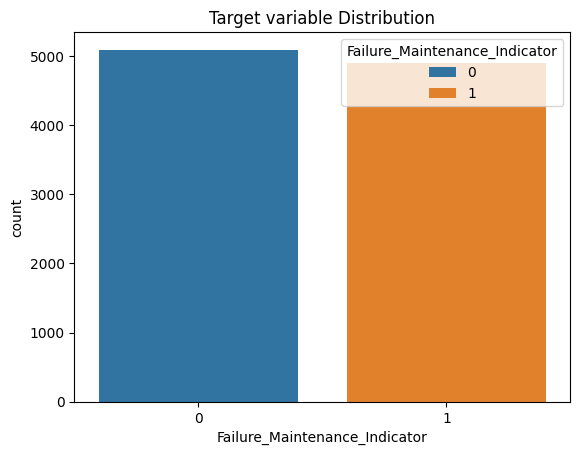

In [ ]:
sns.countplot(x = 'Failure_Maintenance_Indicator', data = df, hue = 'Failure_Maintenance_Indicator' )
plt.title('Target variable Distribution')
print(df['Failure_Maintenance_Indicator'].value_counts())

It is found that the target variable is slightly unbalanced.

### Checking Error_Code distribution

Error_Code
1    5021
0    4979
Name: count, dtype: int64


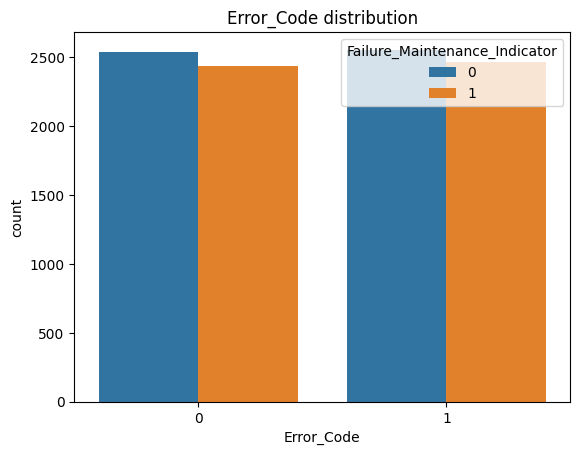

In [ ]:
sns.countplot(x = 'Error_Code', hue = 'Failure_Maintenance_Indicator', data = df)
plt.title('Error_Code distribution')
print(df['Error_Code'].value_counts())

Error_code is distribution is also slightly unbalanced

### Dataset Columns

In [ ]:
df.columns

Index(['Equipment_ID', 'Sensor_1', 'Sensor_2', 'Sensor_3',
       'Environmental_Temperature', 'Environmental_Humidity',
       'Production_Volume', 'Operating_Hours', 'Error_Code', 'Equipment_Age',
       'Power_Consumption', 'Voltage_Fluctuations', 'Current_Fluctuations',
       'Vibration_Analysis', 'Temperature_Gradients', 'Pressure_Levels',
       'Failure_Maintenance_Indicator'],
      dtype='object')

### Checking distribution of Equipment_Age

<Axes: xlabel='Equipment_Age', ylabel='count'>

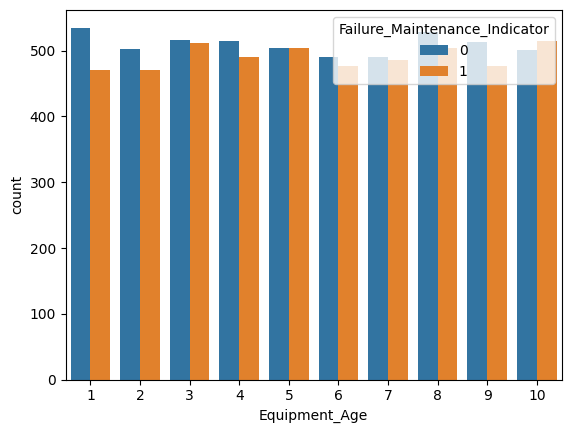

In [ ]:
sns.countplot(x='Equipment_Age',hue='Failure_Maintenance_Indicator',data=df)

In reality, there should be a stronger correlation between equipment age and machine failure rate. That is, as the equipment age increases, so does the failure rate. However, in this case, the failure rate of the machines remains low for up to nine years, followed by an increase in the number of failed machines observed in the tenth year.

### Pairpolt of the Dataset

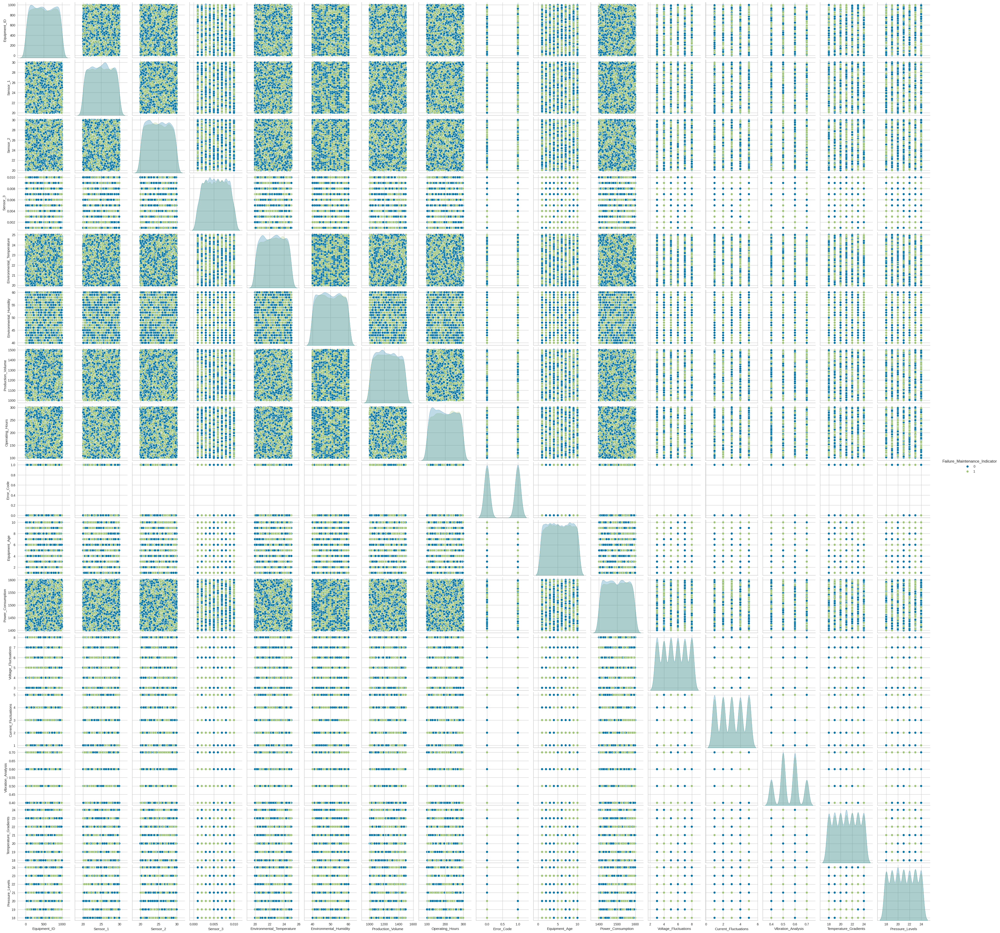

In [ ]:
sns.pairplot(df, hue = 'Failure_Maintenance_Indicator')

Enables the visualization of the relationship between each pair of variables in a dataset.

### Histogram of Features

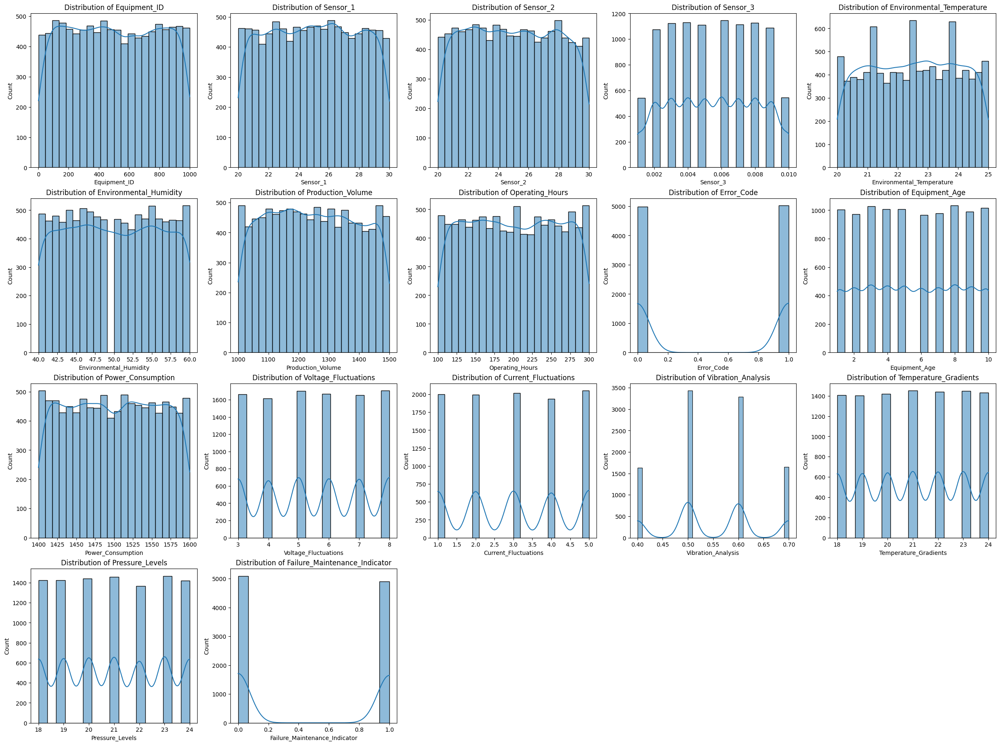

In [ ]:
plt.figure(figsize = (30,28))
for i, col in enumerate(df.columns,1):
    plt.subplot(5,5,i)
    sns.histplot(df[col], kde = True)
    plt.title(f'Distribution of {col}')

Histogram is used to summarize discrete or continuous data that are measured on an interval scale.

Here we can see the distribution of the columns in our dataset.

### Boxplot of Features

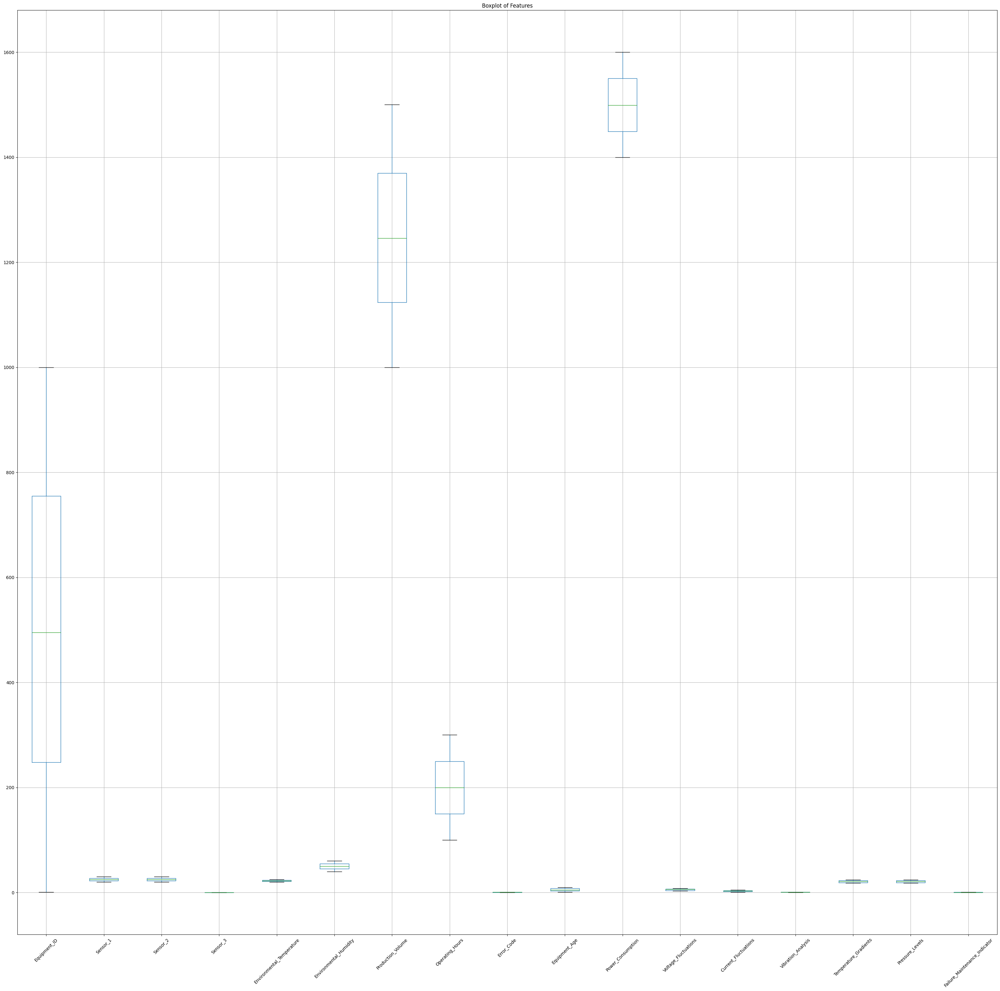

In [ ]:


required_columns = ['Equipment_ID', 'Sensor_1', 'Sensor_2', 'Sensor_3',
       'Environmental_Temperature', 'Environmental_Humidity',
       'Production_Volume', 'Operating_Hours', 'Error_Code', 'Equipment_Age',
       'Power_Consumption', 'Voltage_Fluctuations', 'Current_Fluctuations',
       'Vibration_Analysis', 'Temperature_Gradients', 'Pressure_Levels',
       'Failure_Maintenance_Indicator']



df.boxplot(column=required_columns,figsize=(40,38))
plt.xticks(rotation=45)
plt.title("Boxplot of Features")
plt.show()

It seems like there are no ouliers.

### Blox plot - Target Variable vs Features

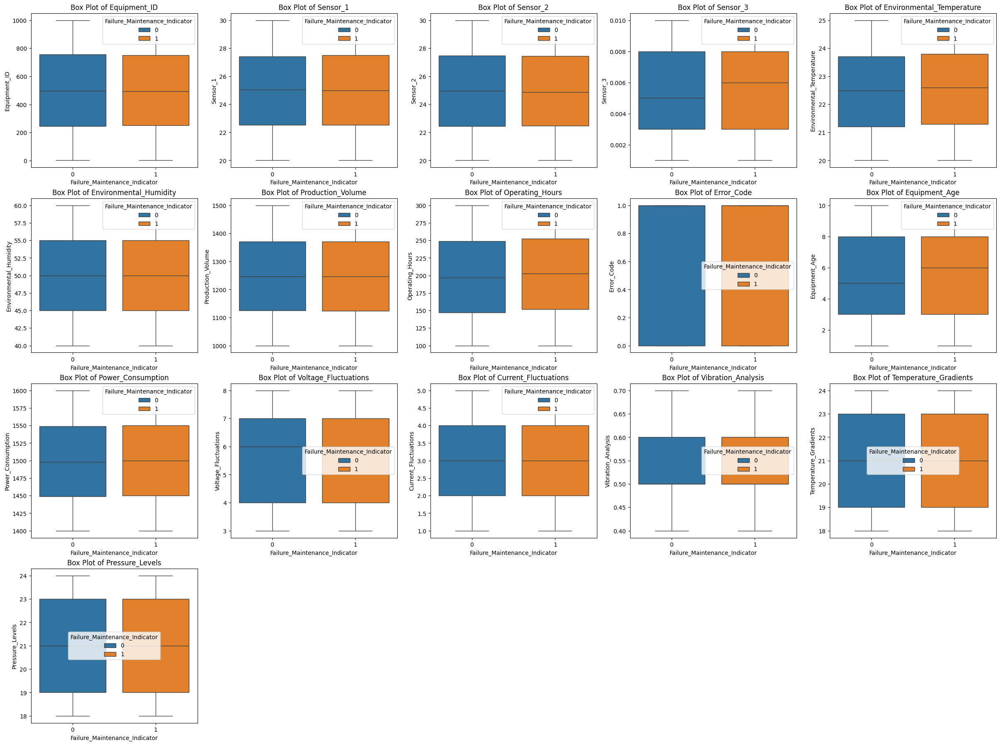

In [ ]:

plt.figure(figsize=(30, 28))
for i, column in enumerate(df.columns[:-1], 1):
    plt.subplot(5, 5, i)
    sns.boxplot(x='Failure_Maintenance_Indicator', y=column, hue='Failure_Maintenance_Indicator', data=df)
    plt.title(f'Box Plot of {column}')

### Checking for Outliers using Z score

In [ ]:
# checking for outliers using z-score
z_scores = (df[required_columns] - df[required_columns].mean()) / df[required_columns].std()
threshold = 3
outliers = (z_scores > threshold) | (z_scores < -threshold)
print("Outliers:")
print(outliers.sum())

Outliers:
Equipment_ID                     0
Sensor_1                         0
Sensor_2                         0
Sensor_3                         0
Environmental_Temperature        0
Environmental_Humidity           0
Production_Volume                0
Operating_Hours                  0
Error_Code                       0
Equipment_Age                    0
Power_Consumption                0
Voltage_Fluctuations             0
Current_Fluctuations             0
Vibration_Analysis               0
Temperature_Gradients            0
Pressure_Levels                  0
Failure_Maintenance_Indicator    0
dtype: int64


### Checking for Outliers using IQR

In [ ]:


for i in required_columns:

    q1 = df[i].quantile(0.25)
    q3 = df[i].quantile(0.75)
    iqr = q3 - q1

    lower_whisker_value = q1 - 1.5 * iqr
    upper_whisker_value = q3 + 1.5 * iqr

    outliers_iqr = (df[i] < lower_whisker_value) | (df[i] > upper_whisker_value)

# Print indices of outliers
    print(f'{i} - Outliers:', outliers_iqr.sum())

Equipment_ID - Outliers: 0
Sensor_1 - Outliers: 0
Sensor_2 - Outliers: 0
Sensor_3 - Outliers: 0
Environmental_Temperature - Outliers: 0
Environmental_Humidity - Outliers: 0
Production_Volume - Outliers: 0
Operating_Hours - Outliers: 0
Error_Code - Outliers: 0
Equipment_Age - Outliers: 0
Power_Consumption - Outliers: 0
Voltage_Fluctuations - Outliers: 0
Current_Fluctuations - Outliers: 0
Vibration_Analysis - Outliers: 0
Temperature_Gradients - Outliers: 0
Pressure_Levels - Outliers: 0
Failure_Maintenance_Indicator - Outliers: 0


There are no outliers in the dataset.

### Correlation matrix of Sensors

In [ ]:
# Example: Calculate pairwise correlations between sensor readings
sensor_correlation_matrix = df[['Sensor_1', 'Sensor_2', 'Sensor_3']].corr()
sensor_correlation_matrix

,Sensor_1,Sensor_2,Sensor_3
Sensor_1,1.000000,-0.002402,-0.004852
Sensor_2,-0.002402,1.000000,-0.002422
Sensor_3,-0.004852,-0.002422,1.000000


### Scatter Plot of Sensor_1 vs Sensor_2

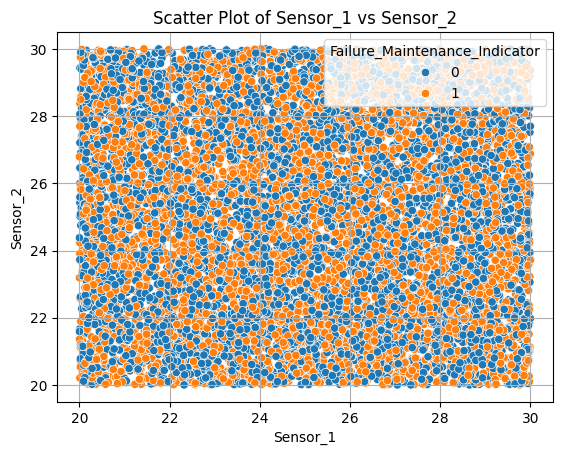

In [ ]:
sns.scatterplot(x='Sensor_1', y='Sensor_2', hue= 'Failure_Maintenance_Indicator', data=df)
plt.title('Scatter Plot of Sensor_1 vs Sensor_2')
plt.xlabel('Sensor_1')
plt.ylabel('Sensor_2')
plt.grid(True)
plt.show()

Looks like there is no realtion.

### Joint plot - Sensor_1 vs Sensor_2

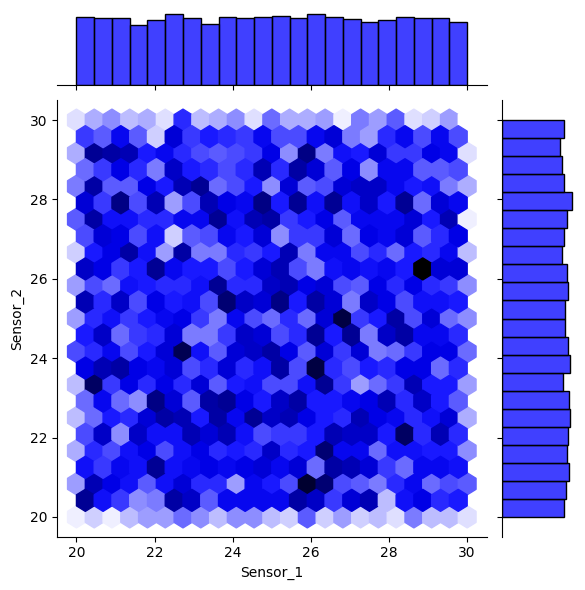

In [ ]:
sns.jointplot(x='Sensor_1', y='Sensor_2', data=df, kind='hex', color='blue')

The feature Equipment_ID doesn't contribute anything for model building. Therefore we can drop Equipment_ID.

In [ ]:
df_new = df.drop(columns=['Equipment_ID'])

### Checking for Zeros in the dataset

In [ ]:

zeros_count = (df_new == 0).sum()

# Display the count of 0's for each column
print("Count of 0's in Each Column:")
print(zeros_count)

Count of 0's in Each Column:
Sensor_1                            0
Sensor_2                            0
Sensor_3                            0
Environmental_Temperature           0
Environmental_Humidity              0
Production_Volume                   0
Operating_Hours                     0
Error_Code                       4979
Equipment_Age                       0
Power_Consumption                   0
Voltage_Fluctuations                0
Current_Fluctuations                0
Vibration_Analysis                  0
Temperature_Gradients               0
Pressure_Levels                     0
Failure_Maintenance_Indicator    5096
dtype: int64


## **Scaling the Independent Variables**

In [ ]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler

X = df_new.drop(columns='Failure_Maintenance_Indicator')
y = df_new['Failure_Maintenance_Indicator']


scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns = X.columns)


Using Standard Scaler to Scale the Features.

### Finding the best Random State

In [ ]:
# Iterate over different random states and train a model for each model
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression

max_accuracy = 0
best_random_state = None

for random_state in range(1100, 1201):  # You can adjust the range based on your needs
    X_train_temp, X_test_temp, y_train_temp, y_test_temp = train_test_split(X_scaled, y, test_size=0.2, random_state=random_state)

    # Build and train your machine learning model (e.g., Logistic Regression)
    model = LogisticRegression()
    model.fit(X_train_temp, y_train_temp)

    # Make predictions on the validation set
    y_val_pred = model.predict(X_test_temp)

    # Calculate accuracy on the validation set
    accuracy = accuracy_score(y_test_temp, y_val_pred)

    # Update max_accuracy and best_random_state if a higher accuracy is found
    if accuracy > max_accuracy:
        max_accuracy = accuracy
        best_random_state = random_state

# Print the results
print("Best Random State:", best_random_state)
print('Max Accuracy:', max_accuracy)

Best Random State: 1171
Max Accuracy: 0.5475


## **Dateset Splitting, Model Building and Evaluation (Without feature Selection)**

Splitting the dataset into 80-20, that is, 80% of the data is for training and 20% of the data is for testing.

I am using Logistic regression, Random forest, Decision tree, SVM, MLP classifier, Gradient boosting machines, Naive Bayes and KNN (K-Nearest Neighbors) classifiers for model building. Evaluation metrics like accuracy_score, confusion_matrix, precision_score, recall_score and f1_score are also used.



In [ ]:
# model building
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier,  GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from math import sqrt
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB


X_val = X_scaled
Y_val = y

X_train, X_test, y_train, y_test = train_test_split(X_val,Y_val, test_size = 0.2, random_state = 1171)




results = []

# Logistic Regression
lr_model = LogisticRegression()
lr_model.fit(X_train, y_train)
lr_pred = lr_model.predict(X_test)
lr_metrics = {
    'Model': 'Logistic Regression',
    'Test Accuracy': accuracy_score(y_test, lr_pred),
    'Train Accuracy': accuracy_score(y_train, lr_model.predict(X_train)),
    'Precision': precision_score(y_test, lr_pred),
    'Recall': recall_score(y_test, lr_pred),
    'F1 score': f1_score(y_test, lr_pred),
    'Train confusion matrix': confusion_matrix(y_train, lr_model.predict(X_train)),
    'Test confusion matrix': confusion_matrix(y_test, lr_pred)

}
results.append(lr_metrics)

# Random Forest
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
rf_pred = rf_model.predict(X_test)
rf_metrics = {
    'Model': 'Random Forest',
    'Test Accuracy': accuracy_score(y_test, rf_pred),
    'Train Accuracy': accuracy_score(y_train, rf_model.predict(X_train)),
    'Precision': precision_score(y_test, rf_pred),
    'Recall': recall_score(y_test, rf_pred),
    'F1 score': f1_score(y_test, rf_pred),
    'Train confusion matrix': confusion_matrix(y_train, rf_model.predict(X_train)),
    'Test confusion matrix': confusion_matrix(y_test, rf_pred)

}
results.append(rf_metrics)

# Decision Tree
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)
dt_pred = dt_model.predict(X_test)
dt_metrics = {
    'Model': 'Decision Tree',
    'Test Accuracy': accuracy_score(y_test, dt_pred),
    'Train Accuracy': accuracy_score(y_train, dt_model.predict(X_train)),
    'Precision': precision_score(y_test, dt_pred),
    'Recall': recall_score(y_test, dt_pred),
    'F1 score': f1_score(y_test, dt_pred),
    'Train confusion matrix': confusion_matrix(y_train, dt_model.predict(X_train)),
    'Test confusion matrix': confusion_matrix(y_test, dt_pred)
}
results.append(dt_metrics)

# Support Vector Machine (SVM)
svm_model = SVC(kernel='linear')
svm_model.fit(X_train, y_train)
svm_pred = svm_model.predict(X_test)
svm_metrics = {
    'Model': 'Support Vector Machine (SVM)',
    'Test Accuracy': accuracy_score(y_test, svm_pred),
    'Train Accuracy': accuracy_score(y_train, svm_model.predict(X_train)),
    'Precision': precision_score(y_test, svm_pred),
    'Recall': recall_score(y_test, svm_pred),
    'F1 score': f1_score(y_test, svm_pred),
    'Train confusion matrix': confusion_matrix(y_train, svm_model.predict(X_train)),
    'Test confusion matrix': confusion_matrix(y_test, svm_pred)
}
results.append(svm_metrics)

# Multi-layer Perceptron (MLP) Classifier
mlp_model = MLPClassifier()
mlp_model.fit(X_train, y_train)
mlp_pred = mlp_model.predict(X_test)
mlp_metrics = {
    'Model': 'Multi-layer Perceptron (MLP) Classifier',
    'Test Accuracy': accuracy_score(y_test, mlp_pred),
    'Train Accuracy': accuracy_score(y_train, mlp_model.predict(X_train)),
    'Precision': precision_score(y_test, mlp_pred),
    'Recall': recall_score(y_test, mlp_pred),
    'F1 score': f1_score(y_test, mlp_pred),
    'Train confusion matrix': confusion_matrix(y_train, mlp_model.predict(X_train)),
    'Test confusion matrix': confusion_matrix(y_test, mlp_pred)
}
results.append(mlp_metrics)

# Gradient Boosting Machines
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train, y_train)
gbm_pred = gbm_model.predict(X_test)
gbm_metrics = {
    'Model': 'Gradient Boosting Machines',
    'Test Accuracy': accuracy_score(y_test, gbm_pred),
    'Train Accuracy': accuracy_score(y_train, gbm_model.predict(X_train)),
    'Precision': precision_score(y_test, gbm_pred),
    'Recall': recall_score(y_test, gbm_pred),
    'F1 score': f1_score(y_test, gbm_pred),
    'Train confusion matrix': confusion_matrix(y_train, gbm_model.predict(X_train)),
    'Test confusion matrix': confusion_matrix(y_test, gbm_pred)
}
results.append(gbm_metrics)

# Gaussian Naive Bayes Classifier
nb_model = GaussianNB()
nb_model.fit(X_train, y_train)
nb_pred = nb_model.predict(X_test)
nb_metrics = {
    'Model': 'Naive Bayes',
    'Test Accuracy': accuracy_score(y_test, nb_pred),
    'Train Accuracy': accuracy_score(y_train, nb_model.predict(X_train)),
    'Precision': precision_score(y_test, nb_pred),
    'Recall': recall_score(y_test, nb_pred),
    'F1 score': f1_score(y_test, nb_pred),
    'Train confusion matrix': confusion_matrix(y_train, nb_model.predict(X_train)),
    'Test confusion matrix': confusion_matrix(y_test, nb_pred)
}
results.append(nb_metrics)

#  KNN Classifier

knn_model = KNeighborsClassifier(n_neighbors=16)
knn_model.fit(X_train, y_train)
knn_pred = knn_model.predict(X_test)
knn_metrics = {
    'Model': 'KNN Classifier',
    'Test Accuracy': accuracy_score(y_test, knn_pred),
    'Train Accuracy': accuracy_score(y_train, knn_model.predict(X_train)),
    'Precision': precision_score(y_test, knn_pred),
    'Recall': recall_score(y_test, knn_pred),
    'F1 score': f1_score(y_test, knn_pred),
    'Train confusion matrix': confusion_matrix(y_train, knn_model.predict(X_train)),
    'Test confusion matrix': confusion_matrix(y_test, knn_pred)
}
results.append(knn_metrics)


# Create DataFrame for results
results_df = pd.DataFrame(results)
results_df

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 score,Train confusion matrix,Test confusion matrix
0,Logistic Regression,0.5475,0.510125,0.527046,0.402542,0.456456,"[[2596, 1444], [2475, 1485]]","[[715, 341], [564, 380]]"
1,Random Forest,0.5230,1.000000,0.494357,0.463983,0.478689,"[[4040, 0], [0, 3960]]","[[608, 448], [506, 438]]"
2,Decision Tree,0.4925,1.000000,0.464535,0.492585,0.478149,"[[4040, 0], [0, 3960]]","[[520, 536], [479, 465]]"
3,Support Vector Machine (SVM),0.5375,0.512000,0.511543,0.445975,0.476514,"[[2431, 1609], [2295, 1665]]","[[654, 402], [523, 421]]"
4,Multi-layer Perceptron (MLP) Classifier,0.4990,0.694625,0.466819,0.432203,0.448845,"[[3042, 998], [1445, 2515]]","[[590, 466], [536, 408]]"
5,Gradient Boosting Machines,0.5095,0.645125,0.479603,0.460805,0.470016,"[[2863, 1177], [1662, 2298]]","[[584, 472], [509, 435]]"
6,Naive Bayes,0.5325,0.513125,0.505590,0.431144,0.465409,"[[2456, 1584], [2311, 1649]]","[[658, 398], [537, 407]]"
7,KNN Classifier,0.5055,0.595625,0.469880,0.371822,0.415139,"[[2845, 1195], [2040, 1920]]","[[660, 396], [593, 351]]"


Without using any feature selection methods or hyperparameter tuning logistic regression gives the best accuracy score (0.5475).

### Selecting the best value for k

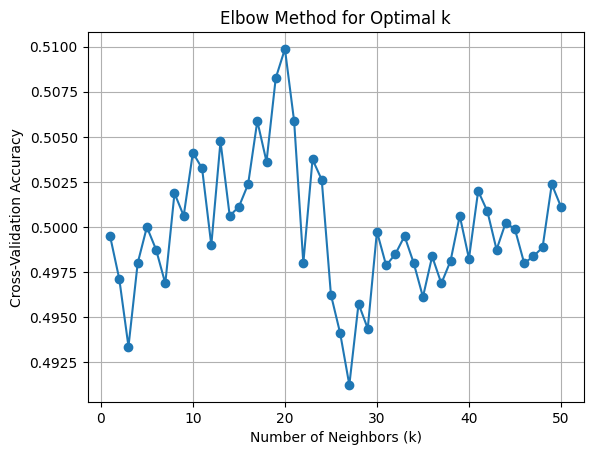

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
k_values = np.arange(1, 51)
accuracy_scores = []

for k in k_values:
    knn_classifier = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn_classifier, X_train, y_train, cv=5, scoring='accuracy')
    accuracy_scores.append(scores.mean())

# Plotting
plt.plot(k_values, accuracy_scores, marker='o')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Cross-Validation Accuracy')
plt.title('Elbow Method for Optimal k')
plt.grid(True)
plt.show()


### Checking the distribution of training data and testing data

In [ ]:
y_train.value_counts()

Failure_Maintenance_Indicator
0    4040
1    3960
Name: count, dtype: int64

In [ ]:
y_test.value_counts()

Failure_Maintenance_Indicator
0    1056
1     944
Name: count, dtype: int64

### Receiver Operating Characteristic (ROC) Curves - Training

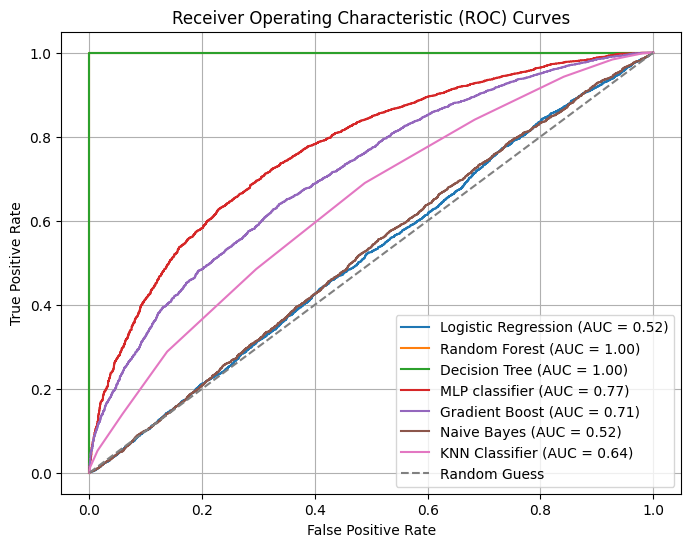

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt


models = [lr_model,rf_model,dt_model,mlp_model,gbm_model,nb_model,knn_model]
model_names = ['Logistic Regression', 'Random Forest', 'Decision Tree','MLP classifier','Gradient Boost','Naive Bayes','KNN Classifier']

plt.figure(figsize=(8, 6))

for model, name in zip(models, model_names):
    y_prob = model.predict_proba(X_train)[:, 1]
    fpr, tpr, _ = roc_curve(y_train, y_prob)
    auc_score = roc_auc_score(y_train, y_prob)
    plt.plot(fpr, tpr, label=f'{name} (AUC = {auc_score:.2f})')


plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess')
plt.legend()
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend()
plt.grid(True)
plt.show()


### Receiver Operating Characteristic (ROC) Curves - Testing


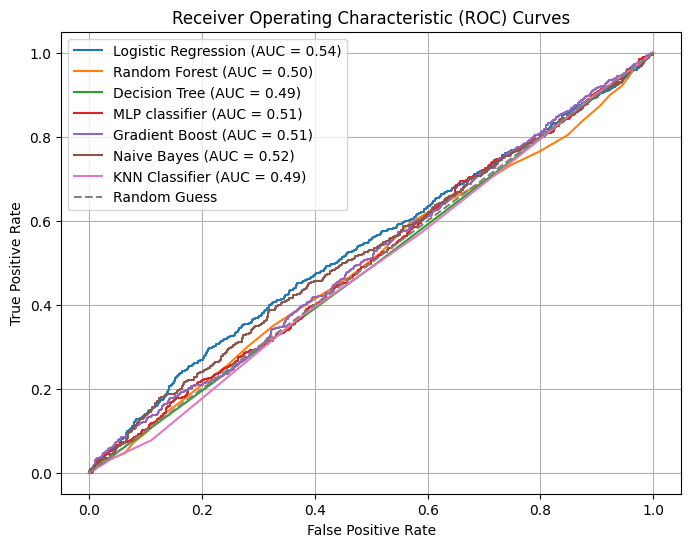

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt


models = [lr_model,rf_model,dt_model,mlp_model,gbm_model,nb_model,knn_model]
model_names = ['Logistic Regression', 'Random Forest', 'Decision Tree','MLP classifier','Gradient Boost','Naive Bayes','KNN Classifier']

plt.figure(figsize=(8, 6))

for model, name in zip(models, model_names):
    y_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    auc_score = roc_auc_score(y_test, y_prob)
    plt.plot(fpr, tpr, label=f'{name} (AUC = {auc_score:.2f})')


plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess')
plt.legend()
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.grid(True)
plt.show()

### ROC curve for SVM - Training

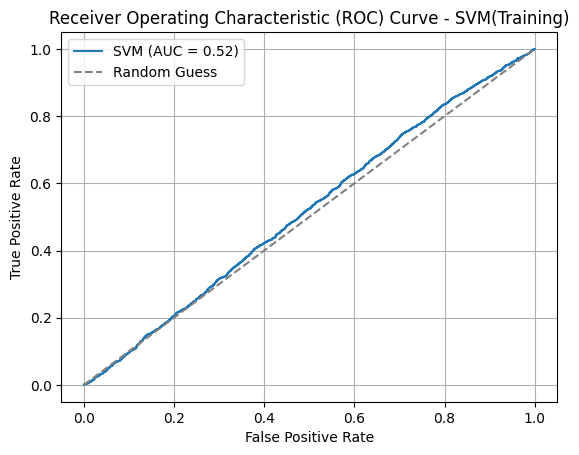

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt


y_scores = svm_model.decision_function(X_train)  # Obtain decision scores instead of probabilities

fpr, tpr, thresholds = roc_curve(y_train, y_scores)
auc_score = roc_auc_score(y_train, y_scores)

plt.plot(fpr, tpr, label=f'SVM (AUC = {auc_score:.2f})')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - SVM(Training)')
plt.legend()
plt.grid(True)
plt.show()


### ROC Curve for SVM - Testing

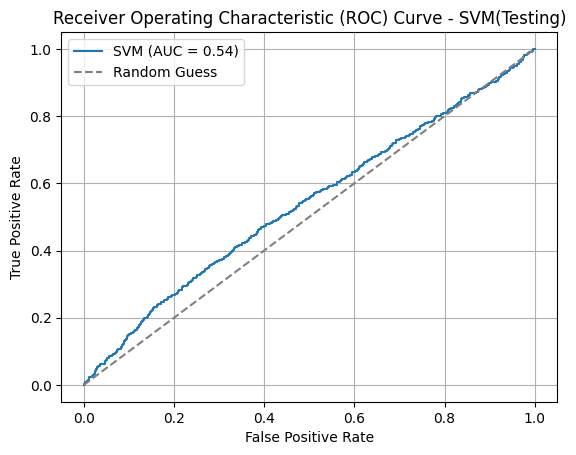

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt


y_scores = svm_model.decision_function(X_test)  # Obtain decision scores instead of probabilities

fpr, tpr, thresholds = roc_curve(y_test, y_scores)
auc_score = roc_auc_score(y_test, y_scores)

plt.plot(fpr, tpr, label=f'SVM (AUC = {auc_score:.2f})')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - SVM(Testing)')
plt.legend()
plt.grid(True)
plt.show()


The performance of the models are not very impressive.

## **Hyperparameter Tuning**

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

# Define hyperparameter grids for each model
param_grid_lr = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}
param_grid_rf = {'n_estimators': [50, 100, 200], 'max_depth': [None, 10, 20], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]}
param_grid_dt = {'max_depth': [None, 10, 20, 30], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]}
param_grid_svm = {'C': [0.001, 0.01, 0.1, 1, 10, 100], 'gamma': [0.001, 0.01, 0.1, 1, 10, 100], 'kernel': ['linear', 'rbf']}
param_grid_mlp = {'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50)], 'alpha': [0.0001, 0.001, 0.01, 0.1], 'max_iter': [1000]}
param_grid_gbm = {'n_estimators': [50, 100, 200], 'max_depth': [3, 5, 7], 'learning_rate': [0.01, 0.1, 0.2]}

# Models
models = {
    'Logistic Regression': (LogisticRegression(), param_grid_lr),
    'Random Forest': (RandomForestClassifier(), param_grid_rf),
    'Decision Tree': (DecisionTreeClassifier(), param_grid_dt),
    'SVM': (SVC(), param_grid_svm),
    'MLP Classifier': (MLPClassifier(), param_grid_mlp),
    'Gradient Boosting Machines': (GradientBoostingClassifier(), param_grid_gbm),
    'KNN': (KNeighborsClassifier(), {'n_neighbors': [3, 5, 7, 9, 11], 'weights': ['uniform', 'distance'], 'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']}),
    'Naive Bayes': (GaussianNB(), {})
}

# Perform hyperparameter tuning for each model
best_models = {}
for name, (model, param_grid) in models.items():
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy')
    grid_search.fit(X_train, y_train)
    best_models[name] = grid_search.best_estimator_

# Print best hyperparameters for each model
for name, model in best_models.items():
    print(f"Best hyperparameters for {name}: {model}")

# Evaluate best models on test set
results = {}
for name, model in best_models.items():
    results[name] = model.score(X_test, y_test)

# Print test accuracy for each model
for name, accuracy in results.items():
    print(f"Test accuracy for {name}: {accuracy}")


Best hyperparameters for Logistic Regression: LogisticRegression(C=10)
Best hyperparameters for Random Forest: RandomForestClassifier(min_samples_leaf=4, n_estimators=50)
Best hyperparameters for Decision Tree: DecisionTreeClassifier(min_samples_leaf=4, min_samples_split=5)
Best hyperparameters for SVM: SVC(C=100, gamma=0.1)
Best hyperparameters for MLP Classifier: MLPClassifier(hidden_layer_sizes=(50, 50), max_iter=1000)
Best hyperparameters for Gradient Boosting Machines: GradientBoostingClassifier(learning_rate=0.01, n_estimators=50)
Best hyperparameters for KNN: KNeighborsClassifier(n_neighbors=11, weights='distance')
Best hyperparameters for Naive Bayes: GaussianNB()
Test accuracy for Logistic Regression: 0.5475
Test accuracy for Random Forest: 0.4905
Test accuracy for Decision Tree: 0.503
Test accuracy for SVM: 0.509
Test accuracy for MLP Classifier: 0.5025
Test accuracy for Gradient Boosting Machines: 0.5295
Test accuracy for KNN: 0.4905
Test accuracy for Naive Bayes: 0.5325


## **Feature Selection and Model building**

### 1. Feature selection using selectK-best

In [ ]:
from sklearn.feature_selection import SelectKBest,f_classif


# use f_classif, which computes the ANOVA F-value for the provided samples
# You can use other scoring functions based on your problem type (e.g., chi2 for classification, f_regression for regression)
selector = SelectKBest(score_func=f_classif, k=12)  # Select the top 12 features

# Fit the selector to your data and transform X to select the top k features
X_selected = selector.fit_transform(X_train, y_train)

# Get the indices of the selected features
selected_indices = selector.get_support(indices=True)

# Get the names of the selected features
selected_features = X_train.columns[selected_indices]

# Print the names of the selected features
print("Selected Features:")
print(selected_features)

Selected Features:
Index(['Sensor_1', 'Sensor_2', 'Environmental_Temperature',
       'Environmental_Humidity', 'Operating_Hours', 'Error_Code',
       'Equipment_Age', 'Power_Consumption', 'Voltage_Fluctuations',
       'Current_Fluctuations', 'Vibration_Analysis', 'Pressure_Levels'],
      dtype='object')


In [ ]:
# model building

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier,  GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from math import sqrt
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB


X1 = X_scaled[['Sensor_1', 'Sensor_2', 'Environmental_Temperature',
       'Environmental_Humidity', 'Operating_Hours', 'Error_Code',
       'Equipment_Age', 'Power_Consumption', 'Voltage_Fluctuations',
       'Current_Fluctuations', 'Vibration_Analysis', 'Pressure_Levels']]
Y1 = y

X1_train, X1_test, Y1_train, Y1_test = train_test_split(X1,Y1, test_size = 0.2, random_state = 1171)




results = []

# Logistic Regression
lr_model = LogisticRegression()
lr_model.fit(X1_train, Y1_train)
lr_pred = lr_model.predict(X1_test)
lr_metrics = {
    'Model': 'Logistic Regression',
    'Test Accuracy': accuracy_score(Y1_test, lr_pred),
    'Train Accuracy': accuracy_score(Y1_train, lr_model.predict(X1_train)),
    'Precision': precision_score(Y1_test, lr_pred),
    'Recall': recall_score(Y1_test, lr_pred),
    'F1 score': f1_score(Y1_test, lr_pred),
    'Train confusion matrix': confusion_matrix(Y1_train, lr_model.predict(X1_train)),
    'Test confusion matrix': confusion_matrix(Y1_test, lr_pred)

}
results.append(lr_metrics)

# Random Forest
rf_model = RandomForestClassifier(min_samples_leaf=4, n_estimators=50)
rf_model.fit(X1_train, Y1_train)
rf_pred = rf_model.predict(X1_test)
rf_metrics = {
    'Model': 'Random Forest',
    'Test Accuracy': accuracy_score(Y1_test, rf_pred),
    'Train Accuracy': accuracy_score(Y1_train, rf_model.predict(X1_train)),
    'Precision': precision_score(Y1_test, rf_pred),
    'Recall': recall_score(Y1_test, rf_pred),
    'F1 score': f1_score(Y1_test, rf_pred),
    'Train confusion matrix': confusion_matrix(Y1_train, rf_model.predict(X1_train)),
    'Test confusion matrix': confusion_matrix(Y1_test, rf_pred)

}
results.append(rf_metrics)

# Decision Tree
dt_model = DecisionTreeClassifier(min_samples_leaf=4, min_samples_split=5)
dt_model.fit(X1_train, Y1_train)
dt_pred = dt_model.predict(X1_test)
dt_metrics = {
    'Model': 'Decision Tree',
    'Test Accuracy': accuracy_score(Y1_test, dt_pred),
    'Train Accuracy': accuracy_score(Y1_train, dt_model.predict(X1_train)),
    'Precision': precision_score(Y1_test, dt_pred),
    'Recall': recall_score(Y1_test, dt_pred),
    'F1 score': f1_score(Y1_test, dt_pred),
    'Train confusion matrix': confusion_matrix(Y1_train, dt_model.predict(X1_train)),
    'Test confusion matrix': confusion_matrix(Y1_test, dt_pred)
}
results.append(dt_metrics)

# Support Vector Machine (SVM)
svm_model = SVC(kernel='linear')
svm_model.fit(X1_train, Y1_train)
svm_pred = svm_model.predict(X1_test)
svm_metrics = {
    'Model': 'Support Vector Machine (SVM)',
    'Test Accuracy': accuracy_score(Y1_test, svm_pred),
    'Train Accuracy': accuracy_score(Y1_train, svm_model.predict(X1_train)),
    'Precision': precision_score(Y1_test, svm_pred),
    'Recall': recall_score(Y1_test, svm_pred),
    'F1 score': f1_score(Y1_test, svm_pred),
    'Train confusion matrix': confusion_matrix(Y1_train, svm_model.predict(X1_train)),
    'Test confusion matrix': confusion_matrix(Y1_test, svm_pred)
}
results.append(svm_metrics)

# Multi-layer Perceptron (MLP) Classifier
mlp_model = MLPClassifier(hidden_layer_sizes=(50, 50), max_iter=1000)
mlp_model.fit(X1_train, Y1_train)
mlp_pred = mlp_model.predict(X1_test)
mlp_metrics = {
    'Model': 'Multi-layer Perceptron (MLP) Classifier',
    'Test Accuracy': accuracy_score(Y1_test, mlp_pred),
    'Train Accuracy': accuracy_score(Y1_train, mlp_model.predict(X1_train)),
    'Precision': precision_score(Y1_test, mlp_pred),
    'Recall': recall_score(Y1_test, mlp_pred),
    'F1 score': f1_score(Y1_test, mlp_pred),
    'Train confusion matrix': confusion_matrix(Y1_train, mlp_model.predict(X1_train)),
    'Test confusion matrix': confusion_matrix(Y1_test, mlp_pred)
}
results.append(mlp_metrics)

# Gradient Boosting Machines
gbm_model = GradientBoostingClassifier(learning_rate=0.01, n_estimators=50)
gbm_model.fit(X1_train, Y1_train)
gbm_pred = gbm_model.predict(X1_test)
gbm_metrics = {
    'Model': 'Gradient Boosting Machines',
    'Test Accuracy': accuracy_score(Y1_test, gbm_pred),
    'Train Accuracy': accuracy_score(Y1_train, gbm_model.predict(X1_train)),
    'Precision': precision_score(Y1_test, gbm_pred),
    'Recall': recall_score(Y1_test, gbm_pred),
    'F1 score': f1_score(Y1_test, gbm_pred),
    'Train confusion matrix': confusion_matrix(Y1_train, gbm_model.predict(X1_train)),
    'Test confusion matrix': confusion_matrix(Y1_test, gbm_pred)
}
results.append(gbm_metrics)

# Gaussian Naive Bayes Classifier
nb_model = GaussianNB()
nb_model.fit(X1_train, Y1_train)
nb_pred = nb_model.predict(X1_test)
nb_metrics = {
    'Model': 'Naive Bayes',
    'Test Accuracy': accuracy_score(Y1_test, nb_pred),
    'Train Accuracy': accuracy_score(Y1_train, nb_model.predict(X1_train)),
    'Precision': precision_score(Y1_test, nb_pred),
    'Recall': recall_score(Y1_test, nb_pred),
    'F1 score': f1_score(Y1_test, nb_pred),
    'Train confusion matrix': confusion_matrix(Y1_train, nb_model.predict(X1_train)),
    'Test confusion matrix': confusion_matrix(Y1_test, nb_pred)
}
results.append(nb_metrics)

#  KNN Classifier

knn_model = KNeighborsClassifier(n_neighbors=16)
knn_model.fit(X1_train, Y1_train)
knn_pred = knn_model.predict(X1_test)
knn_metrics = {
    'Model': 'KNN Classifier',
    'Test Accuracy': accuracy_score(Y1_test, knn_pred),
    'Train Accuracy': accuracy_score(Y1_train, knn_model.predict(X1_train)),
    'Precision': precision_score(Y1_test, knn_pred),
    'Recall': recall_score(Y1_test, knn_pred),
    'F1 score': f1_score(Y1_test, knn_pred),
    'Train confusion matrix': confusion_matrix(Y1_train, knn_model.predict(X1_train)),
    'Test confusion matrix': confusion_matrix(Y1_test, knn_pred)
}
results.append(knn_metrics)


# Create DataFrame for results
results_df = pd.DataFrame(results)
results_df

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 score,Train confusion matrix,Test confusion matrix
0,Logistic Regression,0.5480,0.508875,0.528090,0.398305,0.454106,"[[2591, 1449], [2480, 1480]]","[[720, 336], [568, 376]]"
1,Random Forest,0.4915,0.994750,0.463609,0.492585,0.477658,"[[4022, 18], [24, 3936]]","[[518, 538], [479, 465]]"
2,Decision Tree,0.4980,0.860250,0.468354,0.470339,0.469345,"[[3628, 412], [706, 3254]]","[[552, 504], [500, 444]]"
3,Support Vector Machine (SVM),0.5375,0.508750,0.511860,0.434322,0.469914,"[[2448, 1592], [2338, 1622]]","[[665, 391], [534, 410]]"
4,Multi-layer Perceptron (MLP) Classifier,0.5065,0.813875,0.473555,0.407839,0.438247,"[[3645, 395], [1094, 2866]]","[[628, 428], [559, 385]]"
5,Gradient Boosting Machines,0.5020,0.537000,0.433673,0.180085,0.254491,"[[3474, 566], [3138, 822]]","[[834, 222], [774, 170]]"
6,Naive Bayes,0.5345,0.514375,0.508323,0.420551,0.460290,"[[2493, 1547], [2338, 1622]]","[[672, 384], [547, 397]]"
7,KNN Classifier,0.5190,0.597750,0.488462,0.403602,0.441995,"[[2876, 1164], [2054, 1906]]","[[657, 399], [563, 381]]"


### 2. Feature selection using Random forest classifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier
import numpy as np

# Create a Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the classifier to your data
rf_classifier.fit(X_train,y_train)

# Get feature importances from the trained Random Forest model
feature_importances = rf_classifier.feature_importances_

# Sort feature importances in descending order
sorted_indices = np.argsort(feature_importances)[::-1]

# Select the top k features (e.g., top 12 features)
k = 12
selected_indices = sorted_indices[:k]

# Get the names of the selected features
selected_features = X.columns[selected_indices]

# Print the names of the selected features
print("Selected Features:")
print(selected_features)


Selected Features:
Index(['Sensor_1', 'Production_Volume', 'Sensor_2', 'Power_Consumption',
       'Operating_Hours', 'Environmental_Temperature',
       'Environmental_Humidity', 'Sensor_3', 'Equipment_Age',
       'Pressure_Levels', 'Temperature_Gradients', 'Voltage_Fluctuations'],
      dtype='object')


In [ ]:
# model building


from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier,  GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from math import sqrt
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB


X2 = X_scaled[['Sensor_1', 'Production_Volume', 'Sensor_2', 'Power_Consumption',
       'Operating_Hours', 'Environmental_Temperature',
       'Environmental_Humidity', 'Sensor_3', 'Equipment_Age',
       'Pressure_Levels', 'Temperature_Gradients', 'Voltage_Fluctuations']]
Y2 = y

X2_train, X2_test, Y2_train, Y2_test = train_test_split(X2,Y2, test_size = 0.2, random_state = 1171)



results = []

# Logistic Regression
lr_model = LogisticRegression(C=10)
lr_model.fit(X2_train, Y2_train)
lr_pred = lr_model.predict(X2_test)
lr_metrics = {
    'Model': 'Logistic Regression',
    'Test Accuracy': accuracy_score(Y2_test, lr_pred),
    'Train Accuracy': accuracy_score(Y2_train, lr_model.predict(X2_train)),
    'Precision': precision_score(Y2_test, lr_pred),
    'Recall': recall_score(Y2_test, lr_pred),
    'F1 score': f1_score(Y2_test, lr_pred),
    'Train confusion matrix': confusion_matrix(Y2_train, lr_model.predict(X2_train)),
    'Test confusion matrix': confusion_matrix(Y2_test, lr_pred)

}
results.append(lr_metrics)

# Random Forest
rf_model = RandomForestClassifier(min_samples_leaf=4, n_estimators=50)
rf_model.fit(X2_train, Y2_train)
rf_pred = rf_model.predict(X2_test)
rf_metrics = {
    'Model': 'Random Forest',
    'Test Accuracy': accuracy_score(Y2_test, rf_pred),
    'Train Accuracy': accuracy_score(Y2_train, rf_model.predict(X2_train)),
    'Precision': precision_score(Y2_test, rf_pred),
    'Recall': recall_score(Y2_test, rf_pred),
    'F1 score': f1_score(Y2_test, rf_pred),
    'Train confusion matrix': confusion_matrix(Y2_train, rf_model.predict(X2_train)),
    'Test confusion matrix': confusion_matrix(Y2_test, rf_pred)

}
results.append(rf_metrics)

# Decision Tree
dt_model = DecisionTreeClassifier(min_samples_leaf=4, min_samples_split=5)
dt_model.fit(X2_train, Y2_train)
dt_pred = dt_model.predict(X2_test)
dt_metrics = {
    'Model': 'Decision Tree',
    'Test Accuracy': accuracy_score(Y2_test, dt_pred),
    'Train Accuracy': accuracy_score(Y2_train, dt_model.predict(X2_train)),
    'Precision': precision_score(Y2_test, dt_pred),
    'Recall': recall_score(Y2_test, dt_pred),
    'F1 score': f1_score(Y2_test, dt_pred),
    'Train confusion matrix': confusion_matrix(Y2_train, dt_model.predict(X2_train)),
    'Test confusion matrix': confusion_matrix(Y2_test, dt_pred)
}
results.append(dt_metrics)

# Support Vector Machine (SVM)
svm_model = SVC(kernel='linear', C=100, gamma=0.1)
svm_model.fit(X2_train, Y2_train)
svm_pred = svm_model.predict(X2_test)
svm_metrics = {
    'Model': 'Support Vector Machine (SVM)',
    'Test Accuracy': accuracy_score(Y2_test, svm_pred),
    'Train Accuracy': accuracy_score(Y2_train, svm_model.predict(X2_train)),
    'Precision': precision_score(Y2_test, svm_pred),
    'Recall': recall_score(Y2_test, svm_pred),
    'F1 score': f1_score(Y2_test, svm_pred),
    'Train confusion matrix': confusion_matrix(Y2_train, svm_model.predict(X2_train)),
    'Test confusion matrix': confusion_matrix(Y2_test, svm_pred)
}
results.append(svm_metrics)

# Multi-layer Perceptron (MLP) Classifier
mlp_model = MLPClassifier(hidden_layer_sizes=(50, 50), max_iter=1000)
mlp_model.fit(X2_train, Y2_train)
mlp_pred = mlp_model.predict(X2_test)
mlp_metrics = {
    'Model': 'Multi-layer Perceptron (MLP) Classifier',
    'Test Accuracy': accuracy_score(Y2_test, mlp_pred),
    'Train Accuracy': accuracy_score(Y2_train, mlp_model.predict(X2_train)),
    'Precision': precision_score(Y2_test, mlp_pred),
    'Recall': recall_score(Y2_test, mlp_pred),
    'F1 score': f1_score(Y2_test, mlp_pred),
    'Train confusion matrix': confusion_matrix(Y2_train, mlp_model.predict(X2_train)),
    'Test confusion matrix': confusion_matrix(Y2_test, mlp_pred)
}
results.append(mlp_metrics)

# Gradient Boosting Machines
gbm_model = GradientBoostingClassifier(learning_rate=0.01, n_estimators=50)
gbm_model.fit(X2_train, Y2_train)
gbm_pred = gbm_model.predict(X2_test)
gbm_metrics = {
    'Model': 'Gradient Boosting Machines',
    'Test Accuracy': accuracy_score(Y2_test, gbm_pred),
    'Train Accuracy': accuracy_score(Y2_train, gbm_model.predict(X2_train)),
    'Precision': precision_score(Y2_test, gbm_pred),
    'Recall': recall_score(Y2_test, gbm_pred),
    'F1 score': f1_score(Y2_test, gbm_pred),
    'Train confusion matrix': confusion_matrix(Y2_train, gbm_model.predict(X2_train)),
    'Test confusion matrix': confusion_matrix(Y2_test, gbm_pred)
}
results.append(gbm_metrics)

# Gaussian Naive Bayes Classifier
nb_model = GaussianNB()
nb_model.fit(X2_train, Y2_train)
nb_pred = nb_model.predict(X2_test)
nb_metrics = {
    'Model': 'Naive Bayes',
    'Test Accuracy': accuracy_score(Y2_test, nb_pred),
    'Train Accuracy': accuracy_score(Y2_train, nb_model.predict(X2_train)),
    'Precision': precision_score(Y2_test, nb_pred),
    'Recall': recall_score(Y2_test, nb_pred),
    'F1 score': f1_score(Y2_test, nb_pred),
    'Train confusion matrix': confusion_matrix(Y2_train, nb_model.predict(X2_train)),
    'Test confusion matrix': confusion_matrix(Y2_test, nb_pred)
}
results.append(nb_metrics)

#  KNN Classifier

knn_model = KNeighborsClassifier(n_neighbors=16)
knn_model.fit(X2_train, Y2_train)
knn_pred = knn_model.predict(X2_test)
knn_metrics = {
    'Model': 'KNN Classifier',
    'Test Accuracy': accuracy_score(Y2_test, knn_pred),
    'Train Accuracy': accuracy_score(Y2_train, knn_model.predict(X2_train)),
    'Precision': precision_score(Y2_test, knn_pred),
    'Recall': recall_score(Y2_test, knn_pred),
    'F1 score': f1_score(Y2_test, knn_pred),
    'Train confusion matrix': confusion_matrix(Y2_train, knn_model.predict(X2_train)),
    'Test confusion matrix': confusion_matrix(Y2_test, knn_pred)
}
results.append(knn_metrics)


# Create DataFrame for results
results_df = pd.DataFrame(results)
results_df

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 score,Train confusion matrix,Test confusion matrix
0,Logistic Regression,0.5455,0.510250,0.524544,0.396186,0.451418,"[[2603, 1437], [2481, 1479]]","[[717, 339], [570, 374]]"
1,Random Forest,0.5065,0.997000,0.477297,0.478814,0.478054,"[[4031, 9], [15, 3945]]","[[561, 495], [492, 452]]"
2,Decision Tree,0.5140,0.874500,0.484979,0.478814,0.481876,"[[3680, 360], [644, 3316]]","[[576, 480], [492, 452]]"
3,Support Vector Machine (SVM),0.5435,0.512125,0.518926,0.450212,0.482133,"[[2443, 1597], [2306, 1654]]","[[662, 394], [519, 425]]"
4,Multi-layer Perceptron (MLP) Classifier,0.5000,0.800500,0.472816,0.515890,0.493414,"[[3197, 843], [753, 3207]]","[[513, 543], [457, 487]]"
5,Gradient Boosting Machines,0.5280,0.527375,0.500000,0.093220,0.157143,"[[3827, 213], [3568, 392]]","[[968, 88], [856, 88]]"
6,Naive Bayes,0.5295,0.512000,0.501887,0.422669,0.458884,"[[2492, 1548], [2356, 1604]]","[[660, 396], [545, 399]]"
7,KNN Classifier,0.5035,0.595500,0.467290,0.370763,0.413467,"[[2848, 1192], [2044, 1916]]","[[657, 399], [594, 350]]"


### 3. SelectFromModel with Lasso (L1 Regularization)

In [ ]:
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import Lasso

# Assuming X_ttrain is your feature matrix and Y_train is your target vector
lasso_model = Lasso(alpha=0.0005)  # Adjust alpha as needed
lasso_model.fit(X_train, y_train)

# Use SelectFromModel to select the best 12 features
sfm_selector = SelectFromModel(estimator=lasso_model, max_features=12)
X_selected = sfm_selector.fit_transform(X_train, y_train)

# Get the indices of the selected features
selected_indices = sfm_selector.get_support(indices=True)

# Get the names of the selected features
selected_features = X_train.columns[selected_indices]

# Print the names of the selected features
print("Selected Features:")
print(selected_features)

Selected Features:
Index(['Sensor_1', 'Environmental_Temperature', 'Environmental_Humidity',
       'Production_Volume', 'Operating_Hours', 'Error_Code', 'Equipment_Age',
       'Power_Consumption', 'Voltage_Fluctuations', 'Current_Fluctuations',
       'Vibration_Analysis', 'Pressure_Levels'],
      dtype='object')


In [ ]:
# model building

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier,  GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from math import sqrt
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB


X3 = X_scaled[['Sensor_1', 'Environmental_Temperature', 'Environmental_Humidity',
       'Production_Volume', 'Operating_Hours', 'Error_Code', 'Equipment_Age',
       'Power_Consumption', 'Voltage_Fluctuations', 'Current_Fluctuations',
       'Vibration_Analysis', 'Pressure_Levels']]
Y3 = y

X3_train, X3_test, Y3_train, Y3_test = train_test_split(X3,Y3, test_size = 0.2, random_state = 1171)




results = []

# Logistic Regression
lr_model = LogisticRegression(C=10)
lr_model.fit(X3_train, Y3_train)
lr_pred = lr_model.predict(X3_test)
lr_metrics = {
    'Model': 'Logistic Regression',
    'Test Accuracy': accuracy_score(Y3_test, lr_pred),
    'Train Accuracy': accuracy_score(Y3_train, lr_model.predict(X3_train)),
    'Precision': precision_score(Y3_test, lr_pred),
    'Recall': recall_score(Y3_test, lr_pred),
    'F1 score': f1_score(Y3_test, lr_pred),
    'Train confusion matrix': confusion_matrix(Y3_train, lr_model.predict(X3_train)),
    'Test confusion matrix': confusion_matrix(Y3_test, lr_pred)

}
results.append(lr_metrics)

# Random Forest
rf_model = RandomForestClassifier(min_samples_leaf=4, n_estimators=50)
rf_model.fit(X3_train, Y3_train)
rf_pred = rf_model.predict(X3_test)
rf_metrics = {
    'Model': 'Random Forest',
    'Test Accuracy': accuracy_score(Y3_test, rf_pred),
    'Train Accuracy': accuracy_score(Y3_train, rf_model.predict(X3_train)),
    'Precision': precision_score(Y3_test, rf_pred),
    'Recall': recall_score(Y3_test, rf_pred),
    'F1 score': f1_score(Y3_test, rf_pred),
    'Train confusion matrix': confusion_matrix(Y3_train, rf_model.predict(X3_train)),
    'Test confusion matrix': confusion_matrix(Y3_test, rf_pred)

}
results.append(rf_metrics)

# Decision Tree
dt_model = DecisionTreeClassifier(min_samples_leaf=4, min_samples_split=5)
dt_model.fit(X3_train, Y3_train)
dt_pred = dt_model.predict(X3_test)
dt_metrics = {
    'Model': 'Decision Tree',
    'Test Accuracy': accuracy_score(Y3_test, dt_pred),
    'Train Accuracy': accuracy_score(Y3_train, dt_model.predict(X3_train)),
    'Precision': precision_score(Y3_test, dt_pred),
    'Recall': recall_score(Y3_test, dt_pred),
    'F1 score': f1_score(Y3_test, dt_pred),
    'Train confusion matrix': confusion_matrix(Y3_train, dt_model.predict(X3_train)),
    'Test confusion matrix': confusion_matrix(Y3_test, dt_pred)
}
results.append(dt_metrics)

# Support Vector Machine (SVM)
svm_model = SVC(kernel='linear', C=100, gamma=0.1)
svm_model.fit(X3_train, Y3_train)
svm_pred = svm_model.predict(X3_test)
svm_metrics = {
    'Model': 'Support Vector Machine (SVM)',
    'Test Accuracy': accuracy_score(Y3_test, svm_pred),
    'Train Accuracy': accuracy_score(Y3_train, svm_model.predict(X3_train)),
    'Precision': precision_score(Y3_test, svm_pred),
    'Recall': recall_score(Y3_test, svm_pred),
    'F1 score': f1_score(Y3_test, svm_pred),
    'Train confusion matrix': confusion_matrix(Y3_train, svm_model.predict(X3_train)),
    'Test confusion matrix': confusion_matrix(Y3_test, svm_pred)
}
results.append(svm_metrics)

# Multi-layer Perceptron (MLP) Classifier
mlp_model = MLPClassifier(hidden_layer_sizes=(50, 50), max_iter=1000)
mlp_model.fit(X3_train, Y3_train)
mlp_pred = mlp_model.predict(X3_test)
mlp_metrics = {
    'Model': 'Multi-layer Perceptron (MLP) Classifier',
    'Test Accuracy': accuracy_score(Y3_test, mlp_pred),
    'Train Accuracy': accuracy_score(Y3_train, mlp_model.predict(X3_train)),
    'Precision': precision_score(Y3_test, mlp_pred),
    'Recall': recall_score(Y3_test, mlp_pred),
    'F1 score': f1_score(Y3_test, mlp_pred),
    'Train confusion matrix': confusion_matrix(Y3_train, mlp_model.predict(X3_train)),
    'Test confusion matrix': confusion_matrix(Y3_test, mlp_pred)
}
results.append(mlp_metrics)

# Gradient Boosting Machines
gbm_model = GradientBoostingClassifier(learning_rate=0.01, n_estimators=50)
gbm_model.fit(X3_train, Y3_train)
gbm_pred = gbm_model.predict(X3_test)
gbm_metrics = {
    'Model': 'Gradient Boosting Machines',
    'Test Accuracy': accuracy_score(Y3_test, gbm_pred),
    'Train Accuracy': accuracy_score(Y3_train, gbm_model.predict(X3_train)),
    'Precision': precision_score(Y3_test, gbm_pred),
    'Recall': recall_score(Y3_test, gbm_pred),
    'F1 score': f1_score(Y3_test, gbm_pred),
    'Train confusion matrix': confusion_matrix(Y3_train, gbm_model.predict(X3_train)),
    'Test confusion matrix': confusion_matrix(Y3_test, gbm_pred)
}
results.append(gbm_metrics)

# Gaussian Naive Bayes Classifier
nb_model = GaussianNB()
nb_model.fit(X3_train, Y3_train)
nb_pred = nb_model.predict(X3_test)
nb_metrics = {
    'Model': 'Naive Bayes',
    'Test Accuracy': accuracy_score(Y3_test, nb_pred),
    'Train Accuracy': accuracy_score(Y3_train, nb_model.predict(X3_train)),
    'Precision': precision_score(Y3_test, nb_pred),
    'Recall': recall_score(Y3_test, nb_pred),
    'F1 score': f1_score(Y3_test, nb_pred),
    'Train confusion matrix': confusion_matrix(Y3_train, nb_model.predict(X3_train)),
    'Test confusion matrix': confusion_matrix(Y3_test, nb_pred)
}
results.append(nb_metrics)

#  KNN Classifier

knn_model = KNeighborsClassifier(n_neighbors=16)
knn_model.fit(X3_train, Y3_train)
knn_pred = knn_model.predict(X3_test)
knn_metrics = {
    'Model': 'KNN Classifier',
    'Test Accuracy': accuracy_score(Y3_test, knn_pred),
    'Train Accuracy': accuracy_score(Y3_train, knn_model.predict(X3_train)),
    'Precision': precision_score(Y3_test, knn_pred),
    'Recall': recall_score(Y3_test, knn_pred),
    'F1 score': f1_score(Y3_test, knn_pred),
    'Train confusion matrix': confusion_matrix(Y3_train, knn_model.predict(X3_train)),
    'Test confusion matrix': confusion_matrix(Y3_test, knn_pred)
}
results.append(knn_metrics)


# Create DataFrame for results
results_df = pd.DataFrame(results)
results_df

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 score,Train confusion matrix,Test confusion matrix
0,Logistic Regression,0.5485,0.510125,0.528198,0.406780,0.459605,"[[2595, 1445], [2474, 1486]]","[[713, 343], [560, 384]]"
1,Random Forest,0.5005,0.995375,0.469410,0.447034,0.457949,"[[4023, 17], [20, 3940]]","[[579, 477], [522, 422]]"
2,Decision Tree,0.4935,0.865750,0.462703,0.453390,0.457999,"[[3644, 396], [678, 3282]]","[[559, 497], [516, 428]]"
3,Support Vector Machine (SVM),0.5380,0.510500,0.512438,0.436441,0.471396,"[[2447, 1593], [2323, 1637]]","[[664, 392], [532, 412]]"
4,Multi-layer Perceptron (MLP) Classifier,0.4805,0.826125,0.453568,0.491525,0.471784,"[[3194, 846], [545, 3415]]","[[497, 559], [480, 464]]"
5,Gradient Boosting Machines,0.5260,0.523500,0.487342,0.081568,0.139746,"[[3824, 216], [3596, 364]]","[[975, 81], [867, 77]]"
6,Naive Bayes,0.5325,0.510750,0.505689,0.423729,0.461095,"[[2487, 1553], [2361, 1599]]","[[665, 391], [544, 400]]"
7,KNN Classifier,0.4945,0.593625,0.456094,0.368644,0.407733,"[[2841, 1199], [2052, 1908]]","[[641, 415], [596, 348]]"


### 4. Recursive Feature Elimination (RFE) with a Random Forest Classifier

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier

# Assuming X is your feature matrix and y is your target vector
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Specify the number of features to select (12 in this case)
num_features_to_select = 12

# Create RFE selector with Random Forest classifier
rfe_selector = RFE(estimator=rf_classifier, n_features_to_select=num_features_to_select, step=1)

# Fit RFE selector to the data
rfe_selector.fit(X_train, y_train)

# Get the support (selected features)
selected_features_mask = rfe_selector.support_

# Get the names of the selected features
selected_features = X_train.columns[selected_features_mask]

# Print the names of the selected features
print("Selected Features:")
print(selected_features)

Selected Features:
Index(['Sensor_1', 'Sensor_2', 'Sensor_3', 'Environmental_Temperature',
       'Environmental_Humidity', 'Production_Volume', 'Operating_Hours',
       'Equipment_Age', 'Power_Consumption', 'Voltage_Fluctuations',
       'Temperature_Gradients', 'Pressure_Levels'],
      dtype='object')


In [ ]:
# model building

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier,  GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from math import sqrt
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB


X4 = X_scaled[['Sensor_1', 'Sensor_2', 'Sensor_3', 'Environmental_Temperature',
       'Environmental_Humidity', 'Production_Volume', 'Operating_Hours',
       'Equipment_Age', 'Power_Consumption', 'Voltage_Fluctuations',
       'Temperature_Gradients', 'Pressure_Levels']]
Y4 = y

X4_train, X4_test, Y4_train, Y4_test = train_test_split(X4,Y4, test_size = 0.2, random_state = 1171)




results = []

# Logistic Regression
lr_model = LogisticRegression(C=10)
lr_model.fit(X4_train, Y4_train)
lr_pred = lr_model.predict(X4_test)
lr_metrics = {
    'Model': 'Logistic Regression',
    'Test Accuracy': accuracy_score(Y4_test, lr_pred),
    'Train Accuracy': accuracy_score(Y4_train, lr_model.predict(X4_train)),
    'Precision': precision_score(Y4_test, lr_pred),
    'Recall': recall_score(Y4_test, lr_pred),
    'F1 score': f1_score(Y4_test, lr_pred),
    'Train confusion matrix': confusion_matrix(Y4_train, lr_model.predict(X4_train)),
    'Test confusion matrix': confusion_matrix(Y4_test, lr_pred)

}
results.append(lr_metrics)

# Random Forest
rf_model = RandomForestClassifier(min_samples_leaf=4, n_estimators=50)
rf_model.fit(X4_train, Y4_train)
rf_pred = rf_model.predict(X4_test)
rf_metrics = {
    'Model': 'Random Forest',
    'Test Accuracy': accuracy_score(Y4_test, rf_pred),
    'Train Accuracy': accuracy_score(Y4_train, rf_model.predict(X4_train)),
    'Precision': precision_score(Y4_test, rf_pred),
    'Recall': recall_score(Y4_test, rf_pred),
    'F1 score': f1_score(Y4_test, rf_pred),
    'Train confusion matrix': confusion_matrix(Y4_train, rf_model.predict(X4_train)),
    'Test confusion matrix': confusion_matrix(Y4_test, rf_pred)

}
results.append(rf_metrics)

# Decision Tree
dt_model = DecisionTreeClassifier(min_samples_leaf=4, min_samples_split=5)
dt_model.fit(X4_train, Y4_train)
dt_pred = dt_model.predict(X4_test)
dt_metrics = {
    'Model': 'Decision Tree',
    'Test Accuracy': accuracy_score(Y4_test, dt_pred),
    'Train Accuracy': accuracy_score(Y4_train, dt_model.predict(X4_train)),
    'Precision': precision_score(Y4_test, dt_pred),
    'Recall': recall_score(Y4_test, dt_pred),
    'F1 score': f1_score(Y4_test, dt_pred),
    'Train confusion matrix': confusion_matrix(Y4_train, dt_model.predict(X4_train)),
    'Test confusion matrix': confusion_matrix(Y4_test, dt_pred)
}
results.append(dt_metrics)

# Support Vector Machine (SVM)
svm_model = SVC(kernel='linear', C=100, gamma=0.1)
svm_model.fit(X4_train, Y4_train)
svm_pred = svm_model.predict(X4_test)
svm_metrics = {
    'Model': 'Support Vector Machine (SVM)',
    'Test Accuracy': accuracy_score(Y4_test, svm_pred),
    'Train Accuracy': accuracy_score(Y4_train, svm_model.predict(X4_train)),
    'Precision': precision_score(Y4_test, svm_pred),
    'Recall': recall_score(Y4_test, svm_pred),
    'F1 score': f1_score(Y4_test, svm_pred),
    'Train confusion matrix': confusion_matrix(Y4_train, svm_model.predict(X4_train)),
    'Test confusion matrix': confusion_matrix(Y4_test, svm_pred)
}
results.append(svm_metrics)

# Multi-layer Perceptron (MLP) Classifier
mlp_model = MLPClassifier(hidden_layer_sizes=(50, 50), max_iter=1000)
mlp_model.fit(X4_train, Y4_train)
mlp_pred = mlp_model.predict(X4_test)
mlp_metrics = {
    'Model': 'Multi-layer Perceptron (MLP) Classifier',
    'Test Accuracy': accuracy_score(Y4_test, mlp_pred),
    'Train Accuracy': accuracy_score(Y4_train, mlp_model.predict(X4_train)),
    'Precision': precision_score(Y4_test, mlp_pred),
    'Recall': recall_score(Y4_test, mlp_pred),
    'F1 score': f1_score(Y4_test, mlp_pred),
    'Train confusion matrix': confusion_matrix(Y4_train, mlp_model.predict(X4_train)),
    'Test confusion matrix': confusion_matrix(Y4_test, mlp_pred)
}
results.append(mlp_metrics)

# Gradient Boosting Machines
gbm_model = GradientBoostingClassifier(learning_rate=0.01, n_estimators=50)
gbm_model.fit(X4_train, Y4_train)
gbm_pred = gbm_model.predict(X4_test)
gbm_metrics = {
    'Model': 'Gradient Boosting Machines',
    'Test Accuracy': accuracy_score(Y4_test, gbm_pred),
    'Train Accuracy': accuracy_score(Y4_train, gbm_model.predict(X4_train)),
    'Precision': precision_score(Y4_test, gbm_pred),
    'Recall': recall_score(Y4_test, gbm_pred),
    'F1 score': f1_score(Y4_test, gbm_pred),
    'Train confusion matrix': confusion_matrix(Y4_train, gbm_model.predict(X4_train)),
    'Test confusion matrix': confusion_matrix(Y4_test, gbm_pred)
}
results.append(gbm_metrics)

# Gaussian Naive Bayes Classifier
nb_model = GaussianNB()
nb_model.fit(X4_train, Y4_train)
nb_pred = nb_model.predict(X4_test)
nb_metrics = {
    'Model': 'Naive Bayes',
    'Test Accuracy': accuracy_score(Y4_test, nb_pred),
    'Train Accuracy': accuracy_score(Y4_train, nb_model.predict(X4_train)),
    'Precision': precision_score(Y4_test, nb_pred),
    'Recall': recall_score(Y4_test, nb_pred),
    'F1 score': f1_score(Y4_test, nb_pred),
    'Train confusion matrix': confusion_matrix(Y4_train, nb_model.predict(X4_train)),
    'Test confusion matrix': confusion_matrix(Y4_test, nb_pred)
}
results.append(nb_metrics)

#  KNN Classifier

knn_model = KNeighborsClassifier(n_neighbors=16)
knn_model.fit(X4_train, Y4_train)
knn_pred = knn_model.predict(X4_test)
knn_metrics = {
    'Model': 'KNN Classifier',
    'Test Accuracy': accuracy_score(Y4_test, knn_pred),
    'Train Accuracy': accuracy_score(Y4_train, knn_model.predict(X4_train)),
    'Precision': precision_score(Y4_test, knn_pred),
    'Recall': recall_score(Y4_test, knn_pred),
    'F1 score': f1_score(Y4_test, knn_pred),
    'Train confusion matrix': confusion_matrix(Y4_train, knn_model.predict(X4_train)),
    'Test confusion matrix': confusion_matrix(Y4_test, knn_pred)
}
results.append(knn_metrics)


# Create DataFrame for results
results_df = pd.DataFrame(results)
results_df

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 score,Train confusion matrix,Test confusion matrix
0,Logistic Regression,0.5455,0.510250,0.524544,0.396186,0.451418,"[[2603, 1437], [2481, 1479]]","[[717, 339], [570, 374]]"
1,Random Forest,0.4940,0.997375,0.465306,0.483051,0.474012,"[[4029, 11], [10, 3950]]","[[532, 524], [488, 456]]"
2,Decision Tree,0.5035,0.874125,0.473341,0.460805,0.466989,"[[3686, 354], [653, 3307]]","[[572, 484], [509, 435]]"
3,Support Vector Machine (SVM),0.5440,0.512000,0.519465,0.452331,0.483579,"[[2442, 1598], [2306, 1654]]","[[661, 395], [517, 427]]"
4,Multi-layer Perceptron (MLP) Classifier,0.5015,0.800875,0.476018,0.557203,0.513421,"[[3030, 1010], [583, 3377]]","[[477, 579], [418, 526]]"
5,Gradient Boosting Machines,0.5280,0.527375,0.500000,0.093220,0.157143,"[[3827, 213], [3568, 392]]","[[968, 88], [856, 88]]"
6,Naive Bayes,0.5295,0.512000,0.501887,0.422669,0.458884,"[[2492, 1548], [2356, 1604]]","[[660, 396], [545, 399]]"
7,KNN Classifier,0.5035,0.595500,0.467290,0.370763,0.413467,"[[2848, 1192], [2044, 1916]]","[[657, 399], [594, 350]]"


### 5. Feature selection using Variance Threshold

In [ ]:
from sklearn.feature_selection import VarianceThreshold

# Specify a threshold for variance
threshold_value = 0.05

# Assuming X is your feature matrix
vt_selector = VarianceThreshold(threshold=threshold_value)
X_selected = vt_selector.fit_transform(X_train)

# Get the indices of the selected features
selected_indices = vt_selector.get_support(indices=True)

# Get the names of the selected features
selected_features = X_train.columns[selected_indices]

# If the number of selected features is greater than 12, select the top 12 based on their variance
if len(selected_features) > 12:
    variances = vt_selector.variances_[selected_indices]
    top_12_indices = variances.argsort()[-12:][::-1]
    selected_features = selected_features[top_12_indices]

# Print the names of the selected features
print("Selected Features:")
print(selected_features)

Selected Features:
Index(['Production_Volume', 'Vibration_Analysis', 'Operating_Hours',
       'Environmental_Temperature', 'Equipment_Age', 'Voltage_Fluctuations',
       'Temperature_Gradients', 'Current_Fluctuations', 'Power_Consumption',
       'Error_Code', 'Sensor_3', 'Sensor_1'],
      dtype='object')


In [ ]:
# model building


from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier,  GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from math import sqrt
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB


X5 = X_scaled[['Production_Volume', 'Vibration_Analysis', 'Operating_Hours',
       'Environmental_Temperature', 'Equipment_Age', 'Voltage_Fluctuations',
       'Temperature_Gradients', 'Current_Fluctuations', 'Power_Consumption',
       'Error_Code', 'Sensor_3', 'Sensor_1']]
Y5 = y

X5_train, X5_test, Y5_train, Y5_test = train_test_split(X5,Y5, test_size = 0.2, random_state = 1171)




results = []

# Logistic Regression
lr_model = LogisticRegression(C=10)
lr_model.fit(X5_train, Y5_train)
lr_pred = lr_model.predict(X5_test)
lr_metrics = {
    'Model': 'Logistic Regression',
    'Test Accuracy': accuracy_score(Y5_test, lr_pred),
    'Train Accuracy': accuracy_score(Y5_train, lr_model.predict(X5_train)),
    'Precision': precision_score(Y5_test, lr_pred),
    'Recall': recall_score(Y5_test, lr_pred),
    'F1 score': f1_score(Y5_test, lr_pred),
    'Train confusion matrix': confusion_matrix(Y5_train, lr_model.predict(X5_train)),
    'Test confusion matrix': confusion_matrix(Y5_test, lr_pred)

}
results.append(lr_metrics)

# Random Forest
rf_model = RandomForestClassifier(min_samples_leaf=4, n_estimators=50)
rf_model.fit(X5_train, Y5_train)
rf_pred = rf_model.predict(X5_test)
rf_metrics = {
    'Model': 'Random Forest',
    'Test Accuracy': accuracy_score(Y5_test, rf_pred),
    'Train Accuracy': accuracy_score(Y5_train, rf_model.predict(X5_train)),
    'Precision': precision_score(Y5_test, rf_pred),
    'Recall': recall_score(Y5_test, rf_pred),
    'F1 score': f1_score(Y5_test, rf_pred),
    'Train confusion matrix': confusion_matrix(Y5_train, rf_model.predict(X5_train)),
    'Test confusion matrix': confusion_matrix(Y5_test, rf_pred)

}
results.append(rf_metrics)

# Decision Tree
dt_model = DecisionTreeClassifier(min_samples_leaf=4, min_samples_split=5)
dt_model.fit(X5_train, Y5_train)
dt_pred = dt_model.predict(X5_test)
dt_metrics = {
    'Model': 'Decision Tree',
    'Test Accuracy': accuracy_score(Y5_test, dt_pred),
    'Train Accuracy': accuracy_score(Y5_train, dt_model.predict(X5_train)),
    'Precision': precision_score(Y5_test, dt_pred),
    'Recall': recall_score(Y5_test, dt_pred),
    'F1 score': f1_score(Y5_test, dt_pred),
    'Train confusion matrix': confusion_matrix(Y5_train, dt_model.predict(X5_train)),
    'Test confusion matrix': confusion_matrix(Y5_test, dt_pred)
}
results.append(dt_metrics)

# Support Vector Machine (SVM)
svm_model = SVC(kernel='linear', C=100, gamma=0.1)
svm_model.fit(X5_train, Y5_train)
svm_pred = svm_model.predict(X5_test)
svm_metrics = {
    'Model': 'Support Vector Machine (SVM)',
    'Test Accuracy': accuracy_score(Y5_test, svm_pred),
    'Train Accuracy': accuracy_score(Y5_train, svm_model.predict(X5_train)),
    'Precision': precision_score(Y5_test, svm_pred),
    'Recall': recall_score(Y5_test, svm_pred),
    'F1 score': f1_score(Y5_test, svm_pred),
    'Train confusion matrix': confusion_matrix(Y5_train, svm_model.predict(X5_train)),
    'Test confusion matrix': confusion_matrix(Y5_test, svm_pred)
}
results.append(svm_metrics)

# Multi-layer Perceptron (MLP) Classifier
mlp_model = MLPClassifier(hidden_layer_sizes=(50, 50), max_iter=1000)
mlp_model.fit(X5_train, Y5_train)
mlp_pred = mlp_model.predict(X5_test)
mlp_metrics = {
    'Model': 'Multi-layer Perceptron (MLP) Classifier',
    'Test Accuracy': accuracy_score(Y5_test, mlp_pred),
    'Train Accuracy': accuracy_score(Y5_train, mlp_model.predict(X5_train)),
    'Precision': precision_score(Y5_test, mlp_pred),
    'Recall': recall_score(Y5_test, mlp_pred),
    'F1 score': f1_score(Y5_test, mlp_pred),
    'Train confusion matrix': confusion_matrix(Y5_train, mlp_model.predict(X5_train)),
    'Test confusion matrix': confusion_matrix(Y5_test, mlp_pred)
}
results.append(mlp_metrics)

# Gradient Boosting Machines
gbm_model = GradientBoostingClassifier(learning_rate=0.01, n_estimators=50)
gbm_model.fit(X5_train, Y5_train)
gbm_pred = gbm_model.predict(X5_test)
gbm_metrics = {
    'Model': 'Gradient Boosting Machines',
    'Test Accuracy': accuracy_score(Y5_test, gbm_pred),
    'Train Accuracy': accuracy_score(Y5_train, gbm_model.predict(X5_train)),
    'Precision': precision_score(Y5_test, gbm_pred),
    'Recall': recall_score(Y5_test, gbm_pred),
    'F1 score': f1_score(Y5_test, gbm_pred),
    'Train confusion matrix': confusion_matrix(Y5_train, gbm_model.predict(X5_train)),
    'Test confusion matrix': confusion_matrix(Y5_test, gbm_pred)
}
results.append(gbm_metrics)

# Gaussian Naive Bayes Classifier
nb_model = GaussianNB()
nb_model.fit(X5_train, Y5_train)
nb_pred = nb_model.predict(X5_test)
nb_metrics = {
    'Model': 'Naive Bayes',
    'Test Accuracy': accuracy_score(Y5_test, nb_pred),
    'Train Accuracy': accuracy_score(Y5_train, nb_model.predict(X5_train)),
    'Precision': precision_score(Y5_test, nb_pred),
    'Recall': recall_score(Y5_test, nb_pred),
    'F1 score': f1_score(Y5_test, nb_pred),
    'Train confusion matrix': confusion_matrix(Y5_train, nb_model.predict(X5_train)),
    'Test confusion matrix': confusion_matrix(Y5_test, nb_pred)
}
results.append(nb_metrics)

#  KNN Classifier

knn_model = KNeighborsClassifier(n_neighbors=16)
knn_model.fit(X5_train, Y5_train)
knn_pred = knn_model.predict(X5_test)
knn_metrics = {
    'Model': 'KNN Classifier',
    'Test Accuracy': accuracy_score(Y5_test, knn_pred),
    'Train Accuracy': accuracy_score(Y5_train, knn_model.predict(X5_train)),
    'Precision': precision_score(Y5_test, knn_pred),
    'Recall': recall_score(Y5_test, knn_pred),
    'F1 score': f1_score(Y5_test, knn_pred),
    'Train confusion matrix': confusion_matrix(Y5_train, knn_model.predict(X5_train)),
    'Test confusion matrix': confusion_matrix(Y5_test, knn_pred)
}
results.append(knn_metrics)


# Create DataFrame for results
results_df = pd.DataFrame(results)
results_df

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 score,Train confusion matrix,Test confusion matrix
0,Logistic Regression,0.5330,0.505125,0.507102,0.378178,0.433252,"[[2585, 1455], [2504, 1456]]","[[709, 347], [587, 357]]"
1,Random Forest,0.5000,0.996375,0.470339,0.470339,0.470339,"[[4027, 13], [16, 3944]]","[[556, 500], [500, 444]]"
2,Decision Tree,0.5060,0.865375,0.475169,0.445975,0.460109,"[[3639, 401], [676, 3284]]","[[591, 465], [523, 421]]"
3,Support Vector Machine (SVM),0.5390,0.506000,0.513889,0.431144,0.468894,"[[2439, 1601], [2351, 1609]]","[[671, 385], [537, 407]]"
4,Multi-layer Perceptron (MLP) Classifier,0.5085,0.798500,0.478642,0.462924,0.470652,"[[3508, 532], [1080, 2880]]","[[580, 476], [507, 437]]"
5,Gradient Boosting Machines,0.5250,0.522500,0.481250,0.081568,0.139493,"[[3804, 236], [3584, 376]]","[[973, 83], [867, 77]]"
6,Naive Bayes,0.5225,0.511250,0.493116,0.417373,0.452094,"[[2471, 1569], [2341, 1619]]","[[651, 405], [550, 394]]"
7,KNN Classifier,0.5080,0.600500,0.473958,0.385593,0.425234,"[[2860, 1180], [2016, 1944]]","[[652, 404], [580, 364]]"


Among all these feature selection techniques, SelectFromModel with Lasso (L1 Regularization) method performed well and gave Logistic regression as the best model with an accuracy of 0.5485.

## **Limitations**

---



* Despite the absence of missing values and outliers, the low correlation between features and the target variable suggests that the selected features may not adequately capture the underlying patterns or predictive signals related to equipment failures or maintenance needs.
* The low correlation between features indicates that the chosen features may not fully capture the complex relationships and interactions within the dataset. This limitation could hinder the models' ability to generalize well to unseen data or accurately predict future maintenance events.
* Limited discriminatory power despite using multiple feature selection methods.
Model accuracy may be influenced by complexity, hyperparameter sensitivity, or overfitting.
* The dataset's limited scope or representation of industrial machinery and operational conditions may also contribute to the low accuracy of the models.
* External factors and context not accounted for in the dataset may introduce uncertainty in model predictions.

## **Conclusion**

---



This project highlights the effectiveness of machine learning techniques in developing predictive
maintenance systems for industrial machinery, offering a robust approach to foresee and mitigate
equipment failures.

The examination of eight machine learning models that are Logistic regression, Random forest, Decision tree, SVM, MLP classifier, Gradient boosting machines, Naive Bayes and KNN (K-Nearest Neighbors) classifiers for predicting machine failure shows that Logistic regression is the best performing model with an accuracy of 0.5485.

The feature selection method, SelectFromModel with Lasso (L1 Regularization), showcased promising results by identifying a subset of features conducive to logistic regression modeling. Despite this, the overall predictive performance across models remains modest, with accuracies ranging from 48.05% to 54.85%. These findings underscore the challenges posed by the dataset's limited feature representation and sparse correlations with the target variable.


## **Future works**

---



To enhance predictive capabilities, future efforts should focus on advanced feature engineering, leveraging domain expertise, and exploring ensemble methods. Additionally, considering external factors and conducting thorough sensitivity analyses can provide valuable insights for refining predictive maintenance strategies and improving model effectiveness in real-world scenarios.


Future work could investigate Deep learning models or advanced ensemble methods to enhance model performance. Future efforts may focus on enhancing these models to predict failures at a component level, thus offering more detailed insights into the specific maintenance needs of machines. Additionally, integrating real-time data processing could further improve model responsiveness to sudden changes in machine behavior, potentially leading to more timely and precise failure predictions. This could not only optimize maintenance schedules but also significantly extend the operational life and efficiency of industrial assets.

## Some additional works

### Performing oversampling and undersampling techniques

### 1. Oversampling

In [ ]:
from imblearn.over_sampling import RandomOverSampler

oversample = RandomOverSampler(sampling_strategy='minority')

X_over, y_over = oversample.fit_resample(X, y)

print(f"Result: {y_over.value_counts()/len(y_over)}")

Result: Failure_Maintenance_Indicator
1    0.5
0    0.5
Name: count, dtype: float64


In [ ]:
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import accuracy_score, roc_auc_score, ConfusionMatrixDisplay, RocCurveDisplay, roc_curve, auc

y_scores = []

# Split data into train and validation
X_train_over, X_val_over, y_train_over, y_val_over = train_test_split(X_over, y_over, test_size=0.20, random_state=1171)

# Create transformers for each feature type
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(),X.columns)
    ])

# Create a pipeline
pipeline_over = make_pipeline(preprocessor, LogisticRegression())

# Fit the pipeline to the train set
pipeline_over.fit(X_train_over, y_train_over)

# Compute probabilities
y_score = pipeline_over.predict_proba(X_val_over)
y_scores.append(y_score)

# Compute the accuracy score in the validation set
print(f"Accuracy: {pipeline_over.score(X, y)}")

# Predict probabilities for the positive class (class 1)
y_pred_proba = pipeline_over.predict_proba(X_val_over)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_val_over, y_pred_proba)
print(f"ROC AUC Score: {roc_auc}")

Accuracy: 0.5152
ROC AUC Score: 0.5087144523086515


### 2. Undersampling

In [ ]:
from imblearn.under_sampling import RandomUnderSampler

undersample = RandomUnderSampler(sampling_strategy='majority')

X_under, y_under = undersample.fit_resample(X, y)

print(f"Result: {y_under.value_counts()/len(y_under)}")

Result: Failure_Maintenance_Indicator
0    0.5
1    0.5
Name: count, dtype: float64


In [ ]:
# Split data into train and validation
X_train_under, X_val_under, y_train_under, y_val_under = train_test_split(X_under, y_under, test_size=0.2, random_state=1171)


# Create transformers for each feature type
preprocessor = ColumnTransformer(
    transformers=[

        ('num', StandardScaler(),X.columns)
    ])

# Create a pipeline
pipeline_under = make_pipeline(preprocessor, LogisticRegression())

# Fit the pipeline to the train set
pipeline_under.fit(X_train_under, y_train_under)

# Predict the validation set
y_predicted = pipeline_under.predict(X_val_under)

# Compute probabilities
y_score = pipeline_under.predict_proba(X_val_under)
y_scores.append(y_score)

# Compute the accuracy score in the validation set
print(f"Accuracy: {pipeline_under.score(X, y)}")

# Predict probabilities for the positive class (class 1)
y_pred_proba = pipeline_under.predict_proba(X_val_under)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_val_under, y_pred_proba)
print(f"ROC AUC Score: {roc_auc}")

Accuracy: 0.5188
ROC AUC Score: 0.5022650727650728


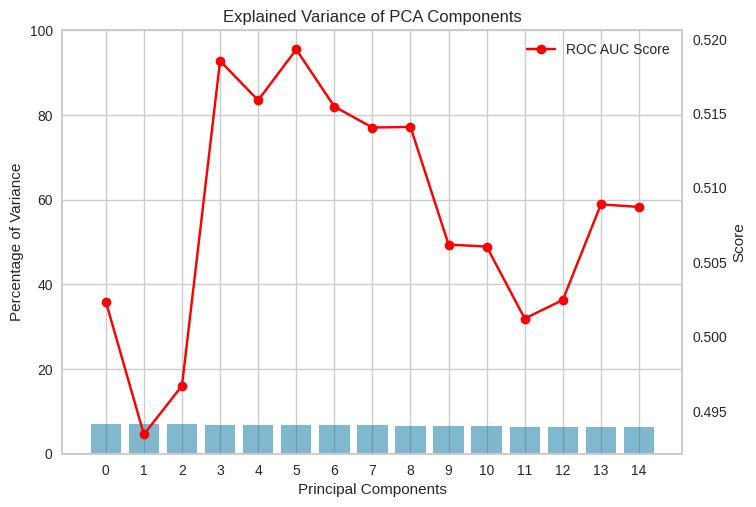

Best n_components: 6


In [ ]:
import numpy as np
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
best_roc_auc = 0
best_n_components = None

n_features = X_train.shape[1]
n_components_range = np.arange(1, n_features + 1)



# Create transformers for each feature type
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), X.columns)
    ])

accuracy_scores = []
roc_auc_scores = []

for n_components in n_components_range:

    # Create a LogisticRegression model
    model = LogisticRegression(class_weight='balanced')
     # Create a pipeline
    pipeline = make_pipeline(preprocessor, PCA(n_components=n_components, random_state=42), model)

    # Fit the pipeline to the train set
    pipeline.fit(X_train_over, y_train_over)

    # Predict probabilities for the positive class (class 1)
    y_pred_proba = pipeline.predict_proba(X_val_over)[:, 1]

    # Calculate ROC AUC score
    roc_auc = roc_auc_score(y_val_over, y_pred_proba)

    roc_auc_scores.append(roc_auc)

    if roc_auc > best_roc_auc:
        best_roc_auc = roc_auc
        best_n_components = n_components

    if n_components == len(n_components_range):
        #  Get the explained variance ratio for each component
        explained_variance_ratio = pipeline.named_steps['pca'].explained_variance_ratio_  * 100

        # Plot the explained variances
        features = range(pipeline.named_steps['pca'].n_components_)

        # Create a bar plot to visualize the explained variance of each component
        plt.bar(features, explained_variance_ratio, alpha=0.5, align='center',
            label='Individual explained variance')
        plt.xlabel('Principal Components')
        plt.ylabel('Percentage of Variance')
        plt.title('Explained Variance of PCA Components')
        plt.ylim(0, 100)
        plt.xticks(features)
          # Create a secondary y-axis for ROC AUC
        ax2 = plt.twinx()

        # Add a line plot for ROC AUC scores
        ax2.plot(features, roc_auc_scores, color='red', label='ROC AUC Score', marker='o')
        ax2.set_ylabel('Score')
        ax2.grid(visible=False)
        plt.legend(loc='best')
        plt.grid(visible=False)
        plt.show()

print(f"Best n_components: {best_n_components}")


/usr/local/lib/python3.10/dist-packages/yellowbrick/model_selection/importances.py:194: YellowbrickWarning: detected multi-dimensional feature importances but stack=False, using mean to aggregate them.
  warnings.warn(


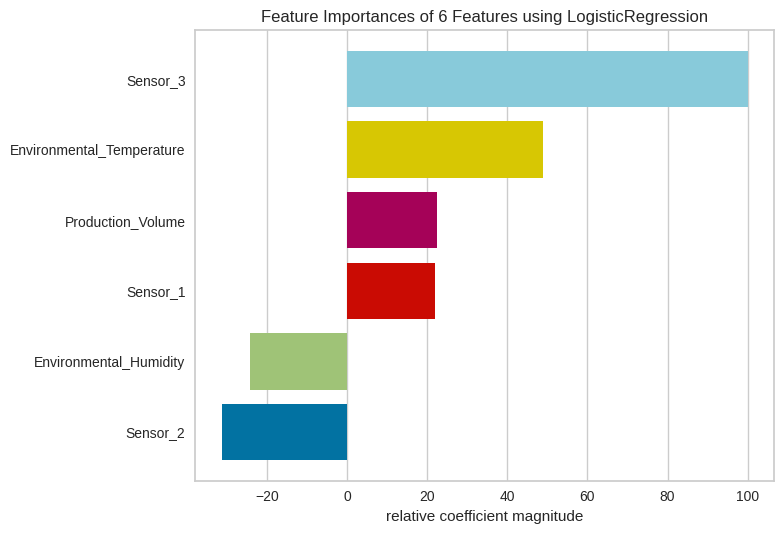

<Axes: title={'center': 'Feature Importances of 6 Features using LogisticRegression'}, xlabel='relative coefficient magnitude'>

In [ ]:
from yellowbrick.model_selection import FeatureImportances


# Create a pipeline
pipeline = make_pipeline(preprocessor,
                         PCA(n_components=best_n_components, random_state=42),
                         LogisticRegression(class_weight='balanced'))

# Fit the pipeline to the train set
pipeline.fit(X_train, y_train)

# Get model back
model = pipeline.named_steps['logisticregression']

# Plot features importance
viz = FeatureImportances(model)
viz.fit(X, y)
viz.show()

In [ ]:
X6 = X_scaled[['Sensor_1', 'Sensor_3', 'Sensor_2', 'Environmental_Temperature', 'Environmental_Humidity',
       'Production_Volume']]
Y6 = y

X6_train, X6_test, Y6_train, Y6_test = train_test_split(X6,Y6, test_size = 0.2, random_state = 1171)




results = []

# Logistic Regression
lr_model = LogisticRegression(C=10)
lr_model.fit(X6_train, Y6_train)
lr_pred = lr_model.predict(X6_test)
lr_metrics = {
    'Model': 'Logistic Regression',
    'Test Accuracy': accuracy_score(Y6_test, lr_pred),
    'Train Accuracy': accuracy_score(Y6_train, lr_model.predict(X6_train)),
    'Precision': precision_score(Y6_test, lr_pred),
    'Recall': recall_score(Y6_test, lr_pred),
    'F1 score': f1_score(Y6_test, lr_pred),
    'Train confusion matrix': confusion_matrix(Y6_train, lr_model.predict(X6_train)),
    'Test confusion matrix': confusion_matrix(Y6_test, lr_pred)

}
results.append(lr_metrics)

results_df = pd.DataFrame(results)
results_df

,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 score,Train confusion matrix,Test confusion matrix
0,Logistic Regression,0.512,0.505125,0.477465,0.35911,0.409915,"[[2750, 1290], [2669, 1291]]","[[685, 371], [605, 339]]"


In [ ]:
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB


scaler_2 = MinMaxScaler()
X_scaled_2 = pd.DataFrame(scaler_2.fit_transform(X), columns = X.columns)

# Define the number of features to select
k_features = 10
# Initialize SelectKBest with chi2 scoring (for classification)
selector = SelectKBest(score_func=chi2, k=k_features)
# Fit selector to your data to select the top k features
X_selected = selector.fit_transform(X_scaled_2, y)
X_val = X_selected
Y_val = y
X_train, X_test, y_train, y_test = train_test_split(X_val,Y_val, test_size = 0.2, random_state = 1171)
results = []
# Logistic Regression
lr_model = LogisticRegression()
lr_model.fit(X_train, y_train)
lr_pred = lr_model.predict(X_test)
lr_metrics = {
    'Model': 'Logistic Regression',
    'Test Accuracy': accuracy_score(y_test, lr_pred),
    'Train Accuracy': accuracy_score(y_train, lr_model.predict(X_train)),
    'Precision': precision_score(y_test, lr_pred),
    'Recall': recall_score(y_test, lr_pred),
    'F1 score': f1_score(y_test, lr_pred),
    'Train confusion matrix': confusion_matrix(y_train, lr_model.predict(X_train)),
    'Test confusion matrix': confusion_matrix(y_test, lr_pred)
}
results.append(lr_metrics)
# Random Forest
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
rf_pred = rf_model.predict(X_test)
rf_metrics = {
    'Model': 'Random Forest',
    'Test Accuracy': accuracy_score(y_test, rf_pred),
    'Train Accuracy': accuracy_score(y_train, rf_model.predict(X_train)),
    'Precision': precision_score(y_test, rf_pred),
    'Recall': recall_score(y_test, rf_pred),
    'F1 score': f1_score(y_test, rf_pred),
    'Train confusion matrix': confusion_matrix(y_train, rf_model.predict(X_train)),
    'Test confusion matrix': confusion_matrix(y_test, rf_pred)
}
results.append(rf_metrics)
# Decision Tree
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)
dt_pred = dt_model.predict(X_test)
dt_metrics = {
    'Model': 'Decision Tree',
    'Test Accuracy': accuracy_score(y_test, dt_pred),
    'Train Accuracy': accuracy_score(y_train, dt_model.predict(X_train)),
    'Precision': precision_score(y_test, dt_pred),
    'Recall': recall_score(y_test, dt_pred),
    'F1 score': f1_score(y_test, dt_pred),
    'Train confusion matrix': confusion_matrix(y_train, dt_model.predict(X_train)),
    'Test confusion matrix': confusion_matrix(y_test, dt_pred)
}
results.append(dt_metrics)
# Support Vector Machine (SVM)
svm_model = SVC(kernel='linear')
svm_model.fit(X_train, y_train)
svm_pred = svm_model.predict(X_test)
svm_metrics = {
    'Model': 'Support Vector Machine (SVM)',
    'Test Accuracy': accuracy_score(y_test, svm_pred),
    'Train Accuracy': accuracy_score(y_train, svm_model.predict(X_train)),
    'Precision': precision_score(y_test, svm_pred),
    'Recall': recall_score(y_test, svm_pred),
    'F1 score': f1_score(y_test, svm_pred),
    'Train confusion matrix': confusion_matrix(y_train, svm_model.predict(X_train)),
    'Test confusion matrix': confusion_matrix(y_test, svm_pred)
}
results.append(svm_metrics)
# Multi-layer Perceptron (MLP) Classifier
mlp_model = MLPClassifier()
mlp_model.fit(X_train, y_train)
mlp_pred = mlp_model.predict(X_test)
mlp_metrics = {
    'Model': 'Multi-layer Perceptron (MLP) Classifier',
    'Test Accuracy': accuracy_score(y_test, mlp_pred),
    'Train Accuracy': accuracy_score(y_train, mlp_model.predict(X_train)),
    'Precision': precision_score(y_test, mlp_pred),
    'Recall': recall_score(y_test, mlp_pred),
    'F1 score': f1_score(y_test, mlp_pred),
    'Train confusion matrix': confusion_matrix(y_train, mlp_model.predict(X_train)),
    'Test confusion matrix': confusion_matrix(y_test, mlp_pred)
}
results.append(mlp_metrics)
# Gradient Boosting Machines
gbm_model = GradientBoostingClassifier()
gbm_model.fit(X_train, y_train)
gbm_pred = gbm_model.predict(X_test)
gbm_metrics = {
    'Model': 'Gradient Boosting Machines',
    'Test Accuracy': accuracy_score(y_test, gbm_pred),
    'Train Accuracy': accuracy_score(y_train, gbm_model.predict(X_train)),
    'Precision': precision_score(y_test, gbm_pred),
    'Recall': recall_score(y_test, gbm_pred),
    'F1 score': f1_score(y_test, gbm_pred),
    'Train confusion matrix': confusion_matrix(y_train, gbm_model.predict(X_train)),
    'Test confusion matrix': confusion_matrix(y_test, gbm_pred)
}
results.append(gbm_metrics)
# Gaussian Naive Bayes Classifier
nb_model = GaussianNB()
nb_model.fit(X_train, y_train)
nb_pred = nb_model.predict(X_test)
nb_metrics = {
    'Model': 'Naive Bayes',
    'Test Accuracy': accuracy_score(y_test, nb_pred),
    'Train Accuracy': accuracy_score(y_train, nb_model.predict(X_train)),
    'Precision': precision_score(y_test, nb_pred),
    'Recall': recall_score(y_test, nb_pred),
    'F1 score': f1_score(y_test, nb_pred),
    'Train confusion matrix': confusion_matrix(y_train, nb_model.predict(X_train)),
    'Test confusion matrix': confusion_matrix(y_test, nb_pred)
}
results.append(nb_metrics)
#  KNN Classifier
knn_model = KNeighborsClassifier(n_neighbors=16)
knn_model.fit(X_train, y_train)
knn_pred = knn_model.predict(X_test)
knn_metrics = {
    'Model': 'KNN Classifier',
    'Test Accuracy': accuracy_score(y_test, knn_pred),
    'Train Accuracy': accuracy_score(y_train, knn_model.predict(X_train)),
    'Precision': precision_score(y_test, knn_pred),
    'Recall': recall_score(y_test, knn_pred),
    'F1 score': f1_score(y_test, knn_pred),
    'Train confusion matrix': confusion_matrix(y_train, knn_model.predict(X_train)),
    'Test confusion matrix': confusion_matrix(y_test, knn_pred)
}
results.append(knn_metrics)
# Create DataFrame for results
results_df = pd.DataFrame(results)
results_df



/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


,Model,Test Accuracy,Train Accuracy,Precision,Recall,F1 score,Train confusion matrix,Test confusion matrix
0,Logistic Regression,0.5490,0.507250,0.529494,0.399364,0.455314,"[[2600, 1440], [2502, 1458]]","[[721, 335], [567, 377]]"
1,Random Forest,0.5110,1.000000,0.482365,0.492585,0.487421,"[[4040, 0], [0, 3960]]","[[557, 499], [479, 465]]"
2,Decision Tree,0.5015,1.000000,0.473943,0.510593,0.491586,"[[4040, 0], [0, 3960]]","[[521, 535], [462, 482]]"
3,Support Vector Machine (SVM),0.5425,0.510125,0.519004,0.419492,0.463972,"[[2499, 1541], [2378, 1582]]","[[689, 367], [548, 396]]"
4,Multi-layer Perceptron (MLP) Classifier,0.4920,0.592125,0.470588,0.610169,0.531365,"[[2071, 1969], [1294, 2666]]","[[408, 648], [368, 576]]"
5,Gradient Boosting Machines,0.4915,0.635125,0.462869,0.481992,0.472237,"[[2720, 1320], [1599, 2361]]","[[528, 528], [489, 455]]"
6,Naive Bayes,0.5310,0.513875,0.503731,0.429025,0.463387,"[[2499, 1541], [2348, 1612]]","[[657, 399], [539, 405]]"
7,KNN Classifier,0.5095,0.598875,0.476190,0.391949,0.429983,"[[2846, 1194], [2015, 1945]]","[[649, 407], [574, 370]]"


In [ ]:
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
# Define the number of features to select
k_features = 10
# Initialize SelectKBest with chi2 scoring (for classification)
selector = SelectKBest(score_func=chi2, k=k_features)
# Fit selector to your data to select the top k features
X_selected = selector.fit_transform(X_scaled_2, y)
max_accuracy = 0
best_random_state = None
for random_state in range(1100, 1201):  # You can adjust the range based on your needs
    X_train_temp, X_test_temp, y_train_temp, y_test_temp = train_test_split(X_selected, y, test_size=0.2, random_state=random_state)
    # Build and train your machine learning model (e.g., Logistic Regression)
    model = LogisticRegression(C=10)
    model.fit(X_train_temp, y_train_temp)
    # Make predictions on the validation set
    y_val_pred = model.predict(X_test_temp)
    # Calculate accuracy on the validation set
    accuracy = accuracy_score(y_test_temp, y_val_pred)
    # Update max_accuracy and best_random_state if a higher accuracy is found
    if accuracy > max_accuracy:
        max_accuracy = accuracy
        best_random_state = random_state
# Print the results
print("Best Random State:", best_random_state)
print('Max Accuracy using {} selected features:', k_features, max_accuracy)

Best Random State: 1171
Max Accuracy using {} selected features: 10 0.548
